In [3]:
import mlflow
from mlflow.client import MlflowClient
from mlflow.entities import ViewType
import os

In [4]:
os.environ["MLFLOW_TRACKING_USERNAME"] = "jaguevara"
os.environ["MLFLOW_TRACKING_PASSWORD"] = "jaguevara_mlflow"
os.environ["MLFLOW_TRACKING_URI"] = "http://192.168.25.110:5000"
os.environ["MLFLOW_EXPERIMENT_NAME"] = "HEAVY_atow_estimation"
mlflow.set_tracking_uri(uri="http://192.168.25.110:5000")
mlflow.set_experiment("HEAVY_atow_estimation")


<Experiment: artifact_location='/home/MLFLOWS/artifacts/55', creation_time=1746435134985, experiment_id='55', last_update_time=1746435134985, lifecycle_stage='active', name='HEAVY_atow_estimation', tags={}>

In [12]:
client = MlflowClient()

try:
    finished_runs = client.search_runs(
        experiment_ids=[55], 
        filter_string="attributes.status = 'FINISHED'",
        order_by=["attributes.end_time DESC"],
        max_results=25,
        run_view_type=ViewType.ACTIVE_ONLY 
    )
    print(f"Found {len(finished_runs)} finished runs:")
    run_ids = []
    for run in finished_runs:
        run_ids.append(run.info.run_id)

except mlflow.exceptions.MlflowException as e:
    print(f"An MLflow error occurred: {e}")
    print("Please ensure your MLflow Tracking Server is running and accessible.")
    print("You can set MLFLOW_TRACKING_URI environment variable or use mlflow.set_tracking_uri().")

Found 25 finished runs:


In [16]:
tags = {"seats": "1", "payload": "1", "mtow_rates": "1", "feature_selection": "1"}

In [17]:
all_tags = {}
for id in run_ids:
    all_tags[id] = tags

In [19]:
for id, t in all_tags.items():
    print(f"Applying tags to run: {id}")
    for key, value in tags.items():
        client.set_tag(id, key, value)
        print(f"  - Tagged '{key}' with '{value}'")

print("\nAll specified tags applied to the runs.")

Applying tags to run: 3a6907d3ea024dd4b501d854af6d0053
  - Tagged 'seats' with '1'
  - Tagged 'payload' with '1'
  - Tagged 'mtow_rates' with '1'
  - Tagged 'feature_selection' with '1'
Applying tags to run: 1d578025cb9a4792819195544682147c
  - Tagged 'seats' with '1'
  - Tagged 'payload' with '1'
  - Tagged 'mtow_rates' with '1'
  - Tagged 'feature_selection' with '1'
Applying tags to run: 818aec66cf9949be99e36e026ef386bc
  - Tagged 'seats' with '1'
  - Tagged 'payload' with '1'
  - Tagged 'mtow_rates' with '1'
  - Tagged 'feature_selection' with '1'
Applying tags to run: 5778d894eba042139de06c497f6dab9c
  - Tagged 'seats' with '1'
  - Tagged 'payload' with '1'
  - Tagged 'mtow_rates' with '1'
  - Tagged 'feature_selection' with '1'
Applying tags to run: 3d21367920854ffa8bfdfdea99624bef
  - Tagged 'seats' with '1'
  - Tagged 'payload' with '1'
  - Tagged 'mtow_rates' with '1'
  - Tagged 'feature_selection' with '1'
Applying tags to run: e4691d3df6314bb2bcccedb9c982e41f
  - Tagged 'sea

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pickle
import pandas as pd
import sys
import os
import mlflow
import numpy as np
import h2o
from matplotlib.colors import Normalize
from mlflow.data.pandas_dataset import PandasDataset
from sklearn.metrics import mean_absolute_error, r2_score, root_mean_squared_error
from utils import process_data, get_model_metrics, preprocess_xgboost, preprocess_lightgbm, preprocess_catboost
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
from atow_estimation.paths import PROCESSED_DATA_DIR

In [3]:
# setting mlflow tracking server
os.environ['MLFLOW_TRACKING_USERNAME'] = 'jaguevara'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'jaguevara_mlflow'
os.environ['MLFLOW_TRACKING_URI'] = 'http://192.168.25.110:5000'
os.environ['MLFLOW_EXPERIMENT_NAME'] = 'HEAVY_atow_estimation'
mlflow.set_tracking_uri(uri='http://192.168.25.110:5000/')
mlflow.set_experiment('HEAVY_atow_estimation') # current experiment

# params for training
test_size = 0.2

# datasets (national departure and international)
data_m1 = pd.read_csv(os.path.join(PROCESSED_DATA_DIR, "processed_data_m1.csv"))
data_m2 = pd.read_csv(os.path.join(PROCESSED_DATA_DIR, "processed_data_m2.csv"))

# split by wake category
data_m1_M = data_m1[data_m1['wake'] == 'M']
data_m1_H = data_m1[data_m1['wake'] == 'H']

data_m2_M = data_m2[data_m2['wake'] == 'M']
data_m2_H = data_m2[data_m2['wake'] == 'H']

# for wake H join national departure with international 
data_H = pd.read_csv(os.path.join(PROCESSED_DATA_DIR, "processed_data_H.csv"))

dataset_m1_M = mlflow.data.from_pandas(
    data_m1_M, name="Flights with climb phase trajectory (M wake category)", targets="tow"
)

dataset_m1_H = mlflow.data.from_pandas(
    data_m1_H, name="Flights with climb phase trajectory (H wake category)", targets="tow"
)

dataset_m2_M = mlflow.data.from_pandas(
    data_m2_M, name="Flights without climb phase trajectory (M wake category)", targets="tow"
)

dataset_m2_H = mlflow.data.from_pandas(
    data_m2_H, name="Flights without climb phase trajectory (H wake category)", targets="tow"
)

dataset_H = mlflow.data.from_pandas(
    data_H, name="All flights (H wake category)", targets="tow"
)

In [29]:
def create_run(dataset, model, model_type, wake_category, model_name, X_test, y_test, lib):
    with mlflow.start_run():
        mlflow.log_input(dataset)
        
        signature = mlflow.models.infer_signature(X_test, y_test)
        
        if lib == 'lightgbm':
            mlflow.lightgbm.log_model(model, f'{model_type}_{wake_category}_{model_name}', signature=signature)
            
        elif lib == 'xgboost':
            mlflow.xgboost.log_model(model, f'{model_type}_{wake_category}_{model_name}', signature=signature)
        
        elif lib == 'catboost':
            mlflow.catboost.log_model(model, f'{model_type}_{wake_category}_{model_name}', signature=signature)        
        
        mlflow.set_tag("mlflow.runName", model_name)

        mlflow.log_param("ML_Algorithm", model_name)
        mlflow.log_param("Train_test_split", test_size)
        
        if lib == 'lightgbm':
            for param, value in model.params.items():
                mlflow.log_param(param, value)    

        else:
            for param, value in model.get_params().items():
                mlflow.log_param(param, value)
        
        y_pred = model.predict(X_test)
        y_pred = model.predict(X_test)
        r2, mae, rmse, mape =  get_model_metrics(y_pred, X_test, y_test)
        print(f"Mean Absolute Error: {mae:.2f}")
        print(f"Root Mean Squared Error: {rmse:.2f}")
        print(f"R^2 Score: {r2:.4f}")
        print(f"Mean Absolute Percentage Error: {mape:.4f}")
        mlflow.log_metric("MAE", mae)
        mlflow.log_metric("RMSE", rmse)
        mlflow.log_metric("R2", r2)
        mlflow.log_metric("MAPE", mape)
        
        if model_type == 'm1+m2':
            mlflow.log_artifact(f'../reports/figures/H/{model_name}_residuals_distribution.png','Figures')
            mlflow.log_artifact(f'../reports/figures/H/{model_name}_scatter_residuals.png','Figures')
            mlflow.log_artifact(f'../reports/figures/H/{model_name}_scatter.png','Figures')                    
        else:
            mlflow.log_artifact(f'../reports/figures/{model_type}/{wake_category}/{model_name}_residuals_distribution.png','Figures')
            mlflow.log_artifact(f'../reports/figures/{model_type}/{wake_category}/{model_name}_scatter_residuals.png','Figures')
            mlflow.log_artifact(f'../reports/figures/{model_type}/{wake_category}/{model_name}_scatter.png','Figures')

In [30]:
tuples = [
 ('m1', 'M_wake', 'LightGBM', 'lightgbm', 'LightGBM_m1_M'),
 ('m1', 'H_wake', 'LightGBM', 'lightgbm', 'LightGBM_m1_H'),
 ('m2', 'M_wake', 'LightGBM', 'lightgbm', 'LightGBM_m2_M'),
 ('m2', 'H_wake', 'LightGBM', 'lightgbm', 'LightGBM_m2_H'),
 
 ('m1', 'M_wake', 'XGBoost', 'xgboost', 'XGBoost_m1_M'),
 ('m1', 'H_wake', 'XGBoost', 'xgboost', 'XGBoost_m1_H'),
 ('m2', 'M_wake', 'XGBoost', 'xgboost', 'XGBoost_m2_M'),
 ('m2', 'H_wake', 'XGBoost', 'xgboost', 'XGBoost_m2_H'),
 
 ('m1', 'M_wake', 'CatBoost', 'catboost', 'CatBoost_m1_M'),
 ('m1', 'H_wake', 'CatBoost', 'catboost', 'CatBoost_m1_H'),
 ('m2', 'M_wake', 'CatBoost', 'catboost', 'CatBoost_m2_M'),
 ('m2', 'H_wake', 'CatBoost', 'catboost', 'CatBoost_m2_H'),
 ]

for t in tuples:
    if t[0] == 'm1' and t[3] == 'lightgbm':
        if t[1] == 'M_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)            
            X_train, X_test, y_train, y_test = preprocess_lightgbm(data_m1_M)
            create_run(dataset_m1_M, model, t[0],t[1], t[2], X_test, y_test, t[3])
        elif t[1] == 'H_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)
            X_train, X_test, y_train, y_test = preprocess_lightgbm(data_m1_H)
            create_run(dataset_m1_H, model, t[0],t[1], t[2], X_test, y_test, t[3])
            
    elif t[0] == 'm2' and t[3] == 'lightgbm':
        if t[1] == 'M_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)            
            X_train, X_test, y_train, y_test = preprocess_lightgbm(data_m2_M)
            create_run(dataset_m2_M, model, t[0],t[1], t[2], X_test, y_test, t[3])
            
        elif t[1] == 'H_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)
            X_train, X_test, y_train, y_test = preprocess_lightgbm(data_m2_H)        
            create_run(dataset_m2_H, model, t[0],t[1], t[2], X_test, y_test, t[3])
            
    elif t[0] == 'm1' and t[3] == 'xgboost':
        if t[1] == 'M_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)            
            X_train, X_test, y_train, y_test = preprocess_xgboost(data_m1_M)
            create_run(dataset_m1_M, model, t[0],t[1], t[2], X_test, y_test, t[3])
            
        elif t[1] == 'H_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)
            X_train, X_test, y_train, y_test = preprocess_xgboost(data_m1_H)
            create_run(dataset_m1_H, model, t[0],t[1], t[2], X_test, y_test, t[3])
            
    elif t[0] == 'm2' and t[3] == 'xgboost':
        if t[1] == 'M_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)            
            X_train, X_test, y_train, y_test = preprocess_xgboost(data_m2_M)
            create_run(dataset_m2_M, model, t[0],t[1], t[2], X_test, y_test, t[3])
            
        elif t[1] == 'H_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)
            X_train, X_test, y_train, y_test = preprocess_xgboost(data_m2_H)        
            create_run(dataset_m2_H, model, t[0],t[1], t[2], X_test, y_test, t[3])
            
    elif t[0] == 'm1' and t[3] == 'catboost':
        if t[1] == 'M_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)            
            X_train, X_test, y_train, y_test, train_pool, test_pool = preprocess_catboost(data_m1_M)
            create_run(dataset_m1_M, model, t[0],t[1], t[2], X_test, y_test, t[3])
        elif t[1] == 'H_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)
            X_train, X_test, y_train, y_test, train_pool, test_pool = preprocess_catboost(data_m1_H)
            create_run(dataset_m1_H, model, t[0],t[1], t[2], X_test, y_test, t[3])
            
    elif t[0] == 'm2' and t[3] == 'catboost':
        if t[1] == 'M_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)            
            X_train, X_test, y_train, y_test, train_pool, test_pool = preprocess_catboost(data_m2_M)
            create_run(dataset_m2_M, model, t[0],t[1], t[2], X_test, y_test, t[3])

        elif t[1] == 'H_wake':
            with open(rf'../models/{t[4]}.pkl', 'rb') as f:
                model = pickle.load(f)
            X_train, X_test, y_train, y_test, train_pool, test_pool = preprocess_catboost(data_m2_H)
            create_run(dataset_m2_H, model, t[0],t[1], t[2], X_test, y_test, t[3])

c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


Mean Absolute Error: 942.99
Root Mean Squared Error: 1319.44
R^2 Score: 0.9679
Mean Absolute Percentage Error: 0.0150
🏃 View run LightGBM at: http://192.168.25.110:5000/#/experiments/55/runs/a972db9a0fc44918ab3d702d75e123f1
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


Mean Absolute Error: 4013.08
Root Mean Squared Error: 5571.42
R^2 Score: 0.9255
Mean Absolute Percentage Error: 0.0237
🏃 View run LightGBM at: http://192.168.25.110:5000/#/experiments/55/runs/d7213618e67c4c97b1fe997fd6f80604
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


Mean Absolute Error: 1103.38
Root Mean Squared Error: 1685.06
R^2 Score: 0.9573
Mean Absolute Percentage Error: 0.0171
🏃 View run LightGBM at: http://192.168.25.110:5000/#/experiments/55/runs/53e815efb1a64fdf862c6411f9fe74de
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


Mean Absolute Error: 4082.66
Root Mean Squared Error: 5554.75
R^2 Score: 0.9617
Mean Absolute Percentage Error: 0.0228
🏃 View run LightGBM at: http://192.168.25.110:5000/#/experiments/55/runs/c3d78cd754b54dd885673ce4ad36ed99
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\xgboost\sklearn.py:1028: UserWarning: [11:34:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\c_api\c_api.cc:1427: Saving model in the UBJSON format as default.  You can use file extension: `json`, `ubj` or `deprecated` to choose between formats.
  self.get_booster().save_model(fname)


Mean Absolute Error: 946.51
Root Mean Squared Error: 1333.73
R^2 Score: 0.9672
Mean Absolute Percentage Error: 0.0150
🏃 View run XGBoost at: http://192.168.25.110:5000/#/experiments/55/runs/4d20d3483bda41fba8cabb59d31287a7
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\xgboost\sklearn.py:1028: UserWarning: [11:35:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\c_api\c_api.cc:1427: Saving model in the UBJSON format as default.  You can use file extension: `json`, `ubj` or `deprecated` to choose between formats.
  self.get_booster().save_model(fname)


Mean Absolute Error: 3905.40
Root Mean Squared Error: 5473.45
R^2 Score: 0.9281
Mean Absolute Percentage Error: 0.0231
🏃 View run XGBoost at: http://192.168.25.110:5000/#/experiments/55/runs/3cc870060ae24f81bbc1d66f1c44d8df
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\xgboost\sklearn.py:1028: UserWarning: [11:36:03] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\c_api\c_api.cc:1427: Saving model in the UBJSON format as default.  You can use file extension: `json`, `ubj` or `deprecated` to choose between formats.
  self.get_booster().save_model(fname)


Mean Absolute Error: 1119.06
Root Mean Squared Error: 1693.68
R^2 Score: 0.9568
Mean Absolute Percentage Error: 0.0174
🏃 View run XGBoost at: http://192.168.25.110:5000/#/experiments/55/runs/098d7d3878fb448b86177a24c9c5330f
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\xgboost\sklearn.py:1028: UserWarning: [11:37:02] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\c_api\c_api.cc:1427: Saving model in the UBJSON format as default.  You can use file extension: `json`, `ubj` or `deprecated` to choose between formats.
  self.get_booster().save_model(fname)


Mean Absolute Error: 3852.74
Root Mean Squared Error: 5219.69
R^2 Score: 0.9662
Mean Absolute Percentage Error: 0.0214
🏃 View run XGBoost at: http://192.168.25.110:5000/#/experiments/55/runs/41649aec06c045c09dc14084c4e7854d
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\Desktop\heavy_datagathering\notebooks\utils.py:855: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  categorical_variables = [
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values

Mean Absolute Error: 950.51
Root Mean Squared Error: 1333.09
R^2 Score: 0.9673
Mean Absolute Percentage Error: 0.0151
🏃 View run CatBoost at: http://192.168.25.110:5000/#/experiments/55/runs/ee1b7b13394a4408b17fb7faff7e572d
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\Desktop\heavy_datagathering\notebooks\utils.py:855: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  categorical_variables = [
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values

Mean Absolute Error: 4022.52
Root Mean Squared Error: 5697.50
R^2 Score: 0.9221
Mean Absolute Percentage Error: 0.0236
🏃 View run CatBoost at: http://192.168.25.110:5000/#/experiments/55/runs/ab52ab2418554c02a691a4af703af409
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\Desktop\heavy_datagathering\notebooks\utils.py:855: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  categorical_variables = [
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values

Mean Absolute Error: 1145.20
Root Mean Squared Error: 1717.12
R^2 Score: 0.9556
Mean Absolute Percentage Error: 0.0178
🏃 View run CatBoost at: http://192.168.25.110:5000/#/experiments/55/runs/2f7dff0f4dc94a40ad4dca5ccfeb0010
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\Desktop\heavy_datagathering\notebooks\utils.py:855: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  categorical_variables = [
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values

Mean Absolute Error: 3895.10
Root Mean Squared Error: 5153.48
R^2 Score: 0.9670
Mean Absolute Percentage Error: 0.0218
🏃 View run CatBoost at: http://192.168.25.110:5000/#/experiments/55/runs/4a053f68d08644b693c9fc24a1e20115
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


In [38]:
model_type = 'm1+m2'
wake_category = 'H_wake'
model_name = 'LightGBM'
lib = 'lightgbm'
with open(r'../models/LightGBM_m1+m2_H.pkl', 'rb') as f:
    model = pickle.load(f)
X_train, X_test, y_train, y_test = preprocess_lightgbm(data_H)

create_run(dataset_H, model, model_type, wake_category, model_name, X_test, y_test, lib)

c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


Mean Absolute Error: 3775.23
Root Mean Squared Error: 4999.10
R^2 Score: 0.9532
Mean Absolute Percentage Error: 0.0218
🏃 View run LightGBM at: http://192.168.25.110:5000/#/experiments/55/runs/9a8d4ca1533642019a9c9f478b6222ba
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


FileNotFoundError: [Errno 2] No such file or directory: '../reports/figures/m1+m2/H_wake/LightGBM_residuals_distribution.png'

---

# XGBoost

## Model 1

In [8]:
train_sample = pd.read_csv('dataset_1/train_sample_XGBoost.csv')
test_sample = pd.read_csv('dataset_1/test_sample_XGBoost.csv')

best_params = {'learning_rate': 0.040098323550537725,
 'max_depth': 5,
 'min_child_weight': 3,
 'gamma': 0.00104351520227709,
 'colsample_bytree': 0.5475618795544261,
 'reg_alpha': 0.00015015300652928973,
 'reg_lambda': 0.0004031900502900804,
 'n_estimators': 1372}

model = XGBRegressor(
    **best_params,
    objective='reg:squarederror',
    random_state=42,
    n_jobs=n_jobs,
    eval_metric="rmse",  # Set eval_metric in the constructor
    early_stopping_rounds=50,  # Set early_stopping_rounds in the constructor
)

X_train = train_sample.drop(columns=['tow'])
y_train = train_sample['tow']

X_test = test_sample.drop(columns=['tow'])
y_test = test_sample['tow']

model.fit(X_train, y_train, eval_set=[(X_test, y_test)])

[0]	validation_0-rmse:34000.05759
[1]	validation_0-rmse:32657.04694
[2]	validation_0-rmse:31365.21820
[3]	validation_0-rmse:30130.62670
[4]	validation_0-rmse:28946.21809
[5]	validation_0-rmse:27821.83928
[6]	validation_0-rmse:26733.58301
[7]	validation_0-rmse:25684.79603
[8]	validation_0-rmse:24678.42255
[9]	validation_0-rmse:23719.79160
[10]	validation_0-rmse:22795.01686
[11]	validation_0-rmse:21914.23960
[12]	validation_0-rmse:21063.28046
[13]	validation_0-rmse:20248.64584
[14]	validation_0-rmse:19464.13854
[15]	validation_0-rmse:18712.78874
[16]	validation_0-rmse:17995.01690
[17]	validation_0-rmse:17307.35020
[18]	validation_0-rmse:16647.67559
[19]	validation_0-rmse:16011.12801
[20]	validation_0-rmse:15402.81138
[21]	validation_0-rmse:14821.75900
[22]	validation_0-rmse:14265.26308
[23]	validation_0-rmse:13730.68652
[24]	validation_0-rmse:13215.51101
[25]	validation_0-rmse:12729.02406
[26]	validation_0-rmse:12262.70255
[27]	validation_0-rmse:11811.23357
[28]	validation_0-rmse:11381.2

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.5475618795544261, device=None,
             early_stopping_rounds=50, enable_categorical=False,
             eval_metric='rmse', feature_types=None, feature_weights=None,
             gamma=0.00104351520227709, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.040098323550537725,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=3, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=1372, n_jobs=4,
             num_parallel_tree=None, ...)

Registered model 'XGBoost_dataset_1_XGBoost' already exists. Creating a new version of this model...
2025/05/06 03:22:32 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: XGBoost_dataset_1_XGBoost, version 2
Created version '2' of model 'XGBoost_dataset_1_XGBoost'.


🏃 View run XGBoost_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/5d3684020f664e58b2648d4795a776ab
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


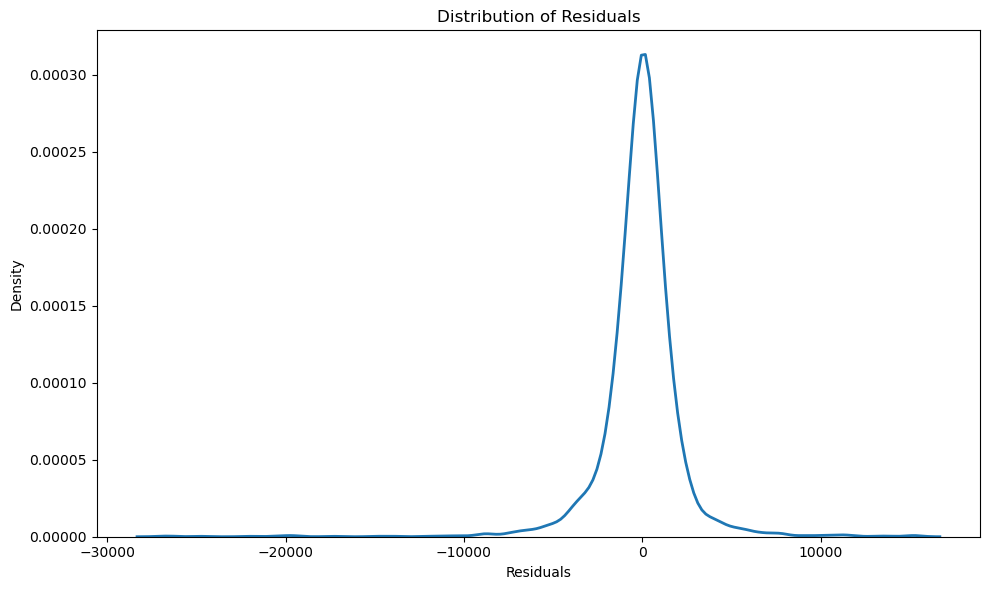

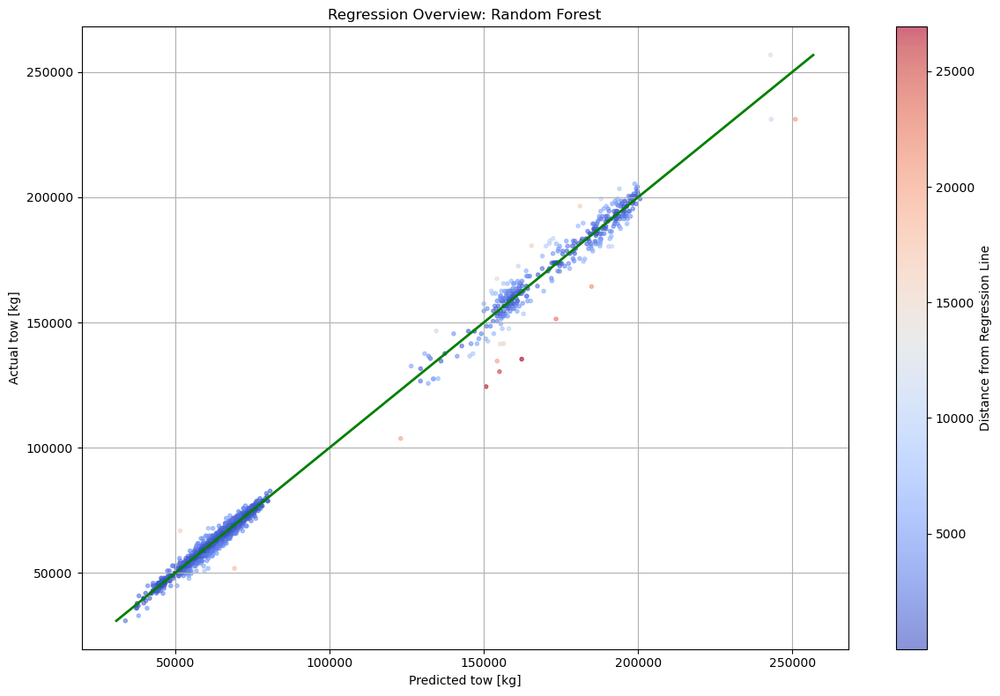

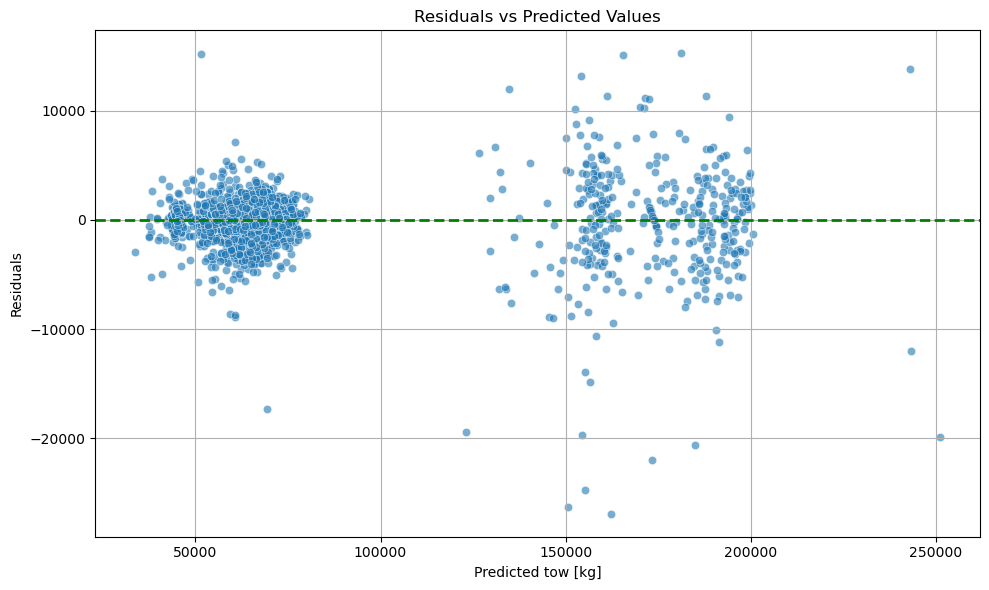

In [9]:
model_name = 'XGBoost'

with mlflow.start_run():
    mlflow.log_input(dataset_1, context="training")
    mlflow.log_artifact('dataset_1/' + "train_sample_" + model_name + ".csv", "dataset")
    mlflow.log_artifact('dataset_1/' + "test_sample_" + model_name + ".csv", "dataset")
    signature = mlflow.models.infer_signature(X_test, y_test)
    mlflow.sklearn.log_model(model, 'XGBoost_dataset_1_' + model_name, registered_model_name='XGBoost_dataset_1_' + model_name, signature=signature)
    mlflow.set_tag("mlflow.runName", "XGBoost_dataset_1")

    mlflow.log_param("ML_Algorithm", model_name)
    mlflow.log_param("Train_test_split", test_size)
    
    for param, value in model.get_params().items():
        mlflow.log_param(param, value)    

    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mlflow.log_metric("MAE", mae)
    mlflow.log_metric("RMSE", rmse)
    mlflow.log_metric("R2", r2)

    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.kdeplot(residuals, linewidth=2)
    plt.title('Distribution of Residuals')
    plt.xlabel('Residuals')
    plt.ylabel('Density')
    plt.tight_layout()
    plt.savefig('dataset_1/' + "residuals_distribution_" + model_name + ".png")

    distances = np.abs(y_pred - y_test)
    norm = Normalize(vmin=0, vmax=np.max(distances))
    colors = plt.cm.coolwarm(norm(distances))  # colormap
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(x=y_pred, y=y_test, c=distances, cmap='coolwarm', marker='.', alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=2, label='Ideal')
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Actual tow [kg]')
    plt.title('Regression Overview: Random Forest')
    plt.grid(True)
    cbar = plt.colorbar(scatter)
    cbar.set_label('Distance from Regression Line')
    plt.tight_layout()
    plt.savefig('dataset_1/' + "regression_scatterplot_" + model_name + ".png")
    
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='green', linestyle='--', linewidth=2)
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted Values')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('dataset_1/' + "residuals_scatterplot_" + model_name + ".png")

    ## Upload the figures of the confusion matrix
    mlflow.log_artifact('dataset_1/' + "residuals_distribution_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_1/' + "regression_scatterplot_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_1/' + "residuals_scatterplot_" + model_name + ".png",'Figures')

## Model 2

In [10]:
train_sample = pd.read_csv('dataset_2/train_sample_XGBoost.csv')
test_sample = pd.read_csv('dataset_2/test_sample_XGBoost.csv')

best_params = {'learning_rate': 0.004274088393501177,
 'max_depth': 12,
 'min_child_weight': 7,
 'gamma': 0.12517622505941403,
 'colsample_bytree': 0.5712152484311244,
 'reg_alpha': 0.022276042552630694,
 'reg_lambda': 0.026370242763999248,
 'n_estimators': 2265}

model = XGBRegressor(
    **best_params,
    objective='reg:squarederror',
    random_state=42,
    n_jobs=n_jobs,
    eval_metric="rmse",  # Set eval_metric in the constructor
    early_stopping_rounds=50,  # Set early_stopping_rounds in the constructor
)

X_train = train_sample.drop(columns=['tow'])
y_train = train_sample['tow']

X_test = test_sample.drop(columns=['tow'])
y_test = test_sample['tow']

model.fit(X_train, y_train, eval_set=[(X_test, y_test)])

[0]	validation_0-rmse:37446.28554
[1]	validation_0-rmse:37287.58991
[2]	validation_0-rmse:37129.77747
[3]	validation_0-rmse:36972.77495
[4]	validation_0-rmse:36815.85046
[5]	validation_0-rmse:36659.41594
[6]	validation_0-rmse:36504.08267
[7]	validation_0-rmse:36349.20076
[8]	validation_0-rmse:36195.41353
[9]	validation_0-rmse:36041.91490
[10]	validation_0-rmse:35889.41779
[11]	validation_0-rmse:35737.59338
[12]	validation_0-rmse:35586.11110
[13]	validation_0-rmse:35435.47107
[14]	validation_0-rmse:35285.79221
[15]	validation_0-rmse:35136.17908
[16]	validation_0-rmse:34987.50100
[17]	validation_0-rmse:34840.35517
[18]	validation_0-rmse:34692.72327
[19]	validation_0-rmse:34545.99490
[20]	validation_0-rmse:34399.58517
[21]	validation_0-rmse:34254.04774
[22]	validation_0-rmse:34109.82606
[23]	validation_0-rmse:33965.19736
[24]	validation_0-rmse:33821.27748
[25]	validation_0-rmse:33678.18340
[26]	validation_0-rmse:33536.96991
[27]	validation_0-rmse:33395.06209
[28]	validation_0-rmse:33253.6

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.5712152484311244, device=None,
             early_stopping_rounds=50, enable_categorical=False,
             eval_metric='rmse', feature_types=None, feature_weights=None,
             gamma=0.12517622505941403, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.004274088393501177,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=12, max_leaves=None,
             min_child_weight=7, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=2265, n_jobs=4,
             num_parallel_tree=None, ...)

Successfully registered model 'XGBoost_dataset_2_XGBoost'.
2025/05/06 03:44:14 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: XGBoost_dataset_2_XGBoost, version 1
Created version '1' of model 'XGBoost_dataset_2_XGBoost'.


🏃 View run XGBoost_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/2a05f3fb797c4af3899a2eb815942399
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


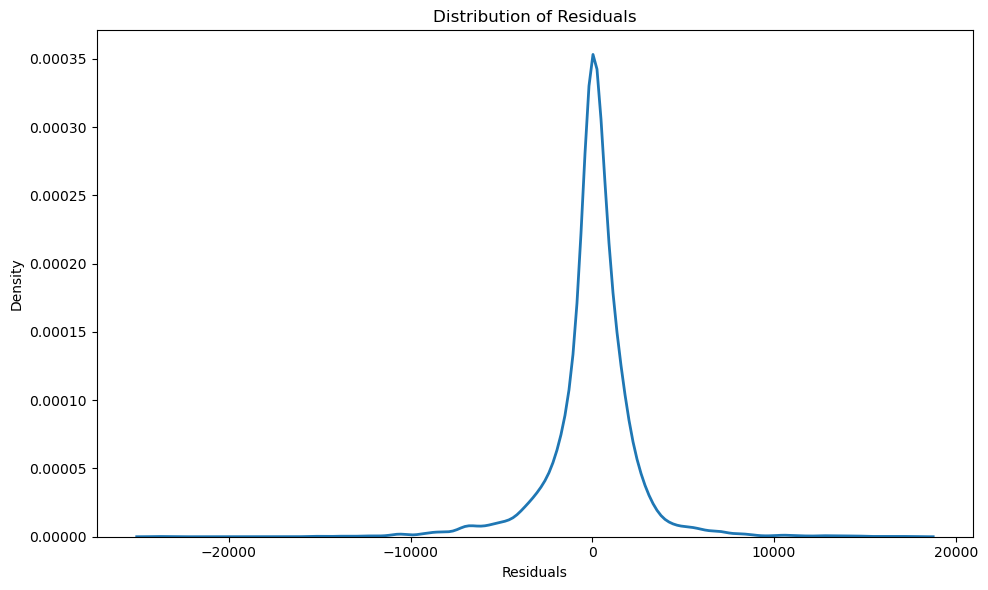

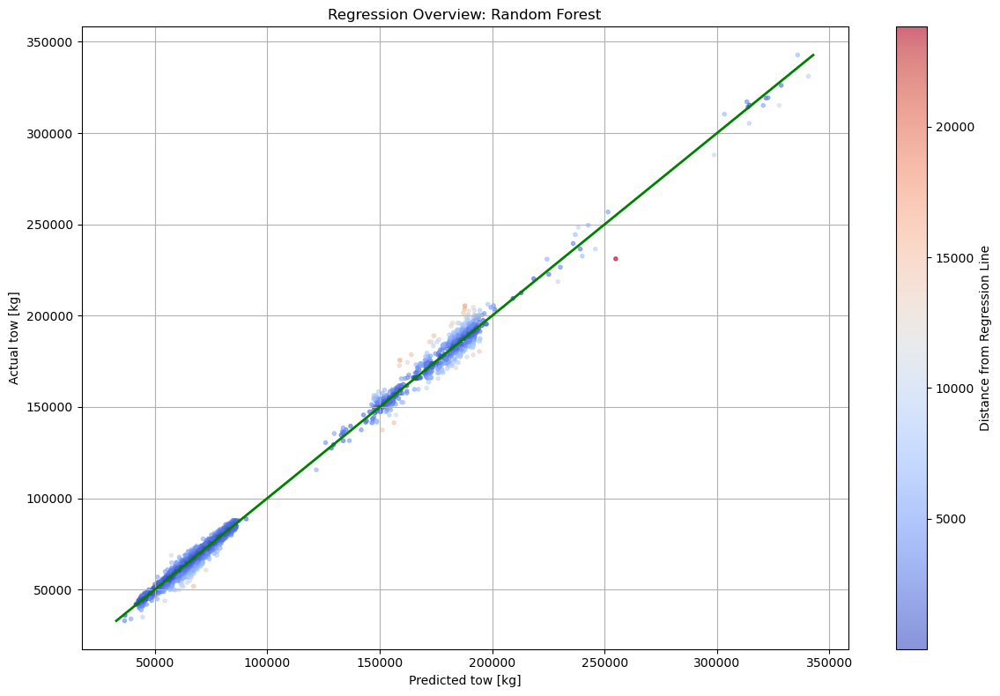

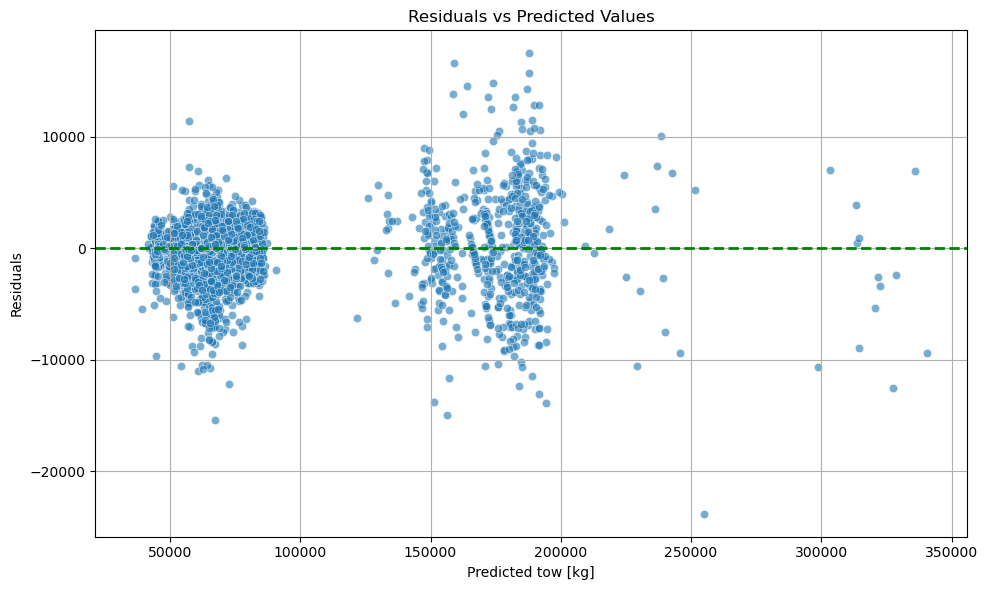

In [11]:
model_name = 'XGBoost'

with mlflow.start_run():
    mlflow.log_input(dataset_2, context="training")
    mlflow.log_artifact('dataset_2/' + "train_sample_" + model_name + ".csv", "dataset")
    mlflow.log_artifact('dataset_2/' + "test_sample_" + model_name + ".csv", "dataset")
    signature = mlflow.models.infer_signature(X_test, y_test)
    mlflow.sklearn.log_model(model, 'XGBoost_dataset_2_' + model_name, registered_model_name='XGBoost_dataset_2_' + model_name, signature=signature)
    mlflow.set_tag("mlflow.runName", "XGBoost_dataset_2")

    mlflow.log_param("ML_Algorithm", model_name)
    mlflow.log_param("Train_test_split", test_size)
    
    for param, value in model.get_params().items():
        mlflow.log_param(param, value)    

    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mlflow.log_metric("MAE", mae)
    mlflow.log_metric("RMSE", rmse)
    mlflow.log_metric("R2", r2)

    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.kdeplot(residuals, linewidth=2)
    plt.title('Distribution of Residuals')
    plt.xlabel('Residuals')
    plt.ylabel('Density')
    plt.tight_layout()
    plt.savefig('dataset_2/' + "residuals_distribution_" + model_name + ".png")

    distances = np.abs(y_pred - y_test)
    norm = Normalize(vmin=0, vmax=np.max(distances))
    colors = plt.cm.coolwarm(norm(distances))  # colormap
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(x=y_pred, y=y_test, c=distances, cmap='coolwarm', marker='.', alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=2, label='Ideal')
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Actual tow [kg]')
    plt.title('Regression Overview: Random Forest')
    plt.grid(True)
    cbar = plt.colorbar(scatter)
    cbar.set_label('Distance from Regression Line')
    plt.tight_layout()
    plt.savefig('dataset_2/' + "regression_scatterplot_" + model_name + ".png")
    
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='green', linestyle='--', linewidth=2)
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted Values')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('dataset_2/' + "residuals_scatterplot_" + model_name + ".png")

    mlflow.log_artifact('dataset_2/' + "residuals_distribution_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_2/' + "regression_scatterplot_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_2/' + "residuals_scatterplot_" + model_name + ".png",'Figures')

# CatBoost

## Model 1

In [14]:
train_sample = pd.read_csv('dataset_1/train_sample_CatBoost.csv')
test_sample = pd.read_csv('dataset_1/test_sample_CatBoost.csv')

best_params = {'reg_lambda': 9.026352565645713,
 'random_strength': 29.204166216586533,
 'depth': 6,
 'min_data_in_leaf': 5,
 'leaf_estimation_iterations': 3}

model = CatBoostRegressor(
    iterations=20000,
    eval_metric=metrics.RMSE(),
    random_seed=42,
    logging_level='Silent',
    objective=metrics.RMSE(),
    task_type='CPU',
    use_best_model=True,
    od_type='Iter',
    od_wait=50,
    **best_params,
)

X_train = train_sample.drop(columns=['tow'])
y_train = train_sample['tow']

X_test = test_sample.drop(columns=['tow'])
y_test = test_sample['tow']

categorical_variables = ['routeType', 'flightType', 'wake', 'RECATwake', 'numberOfEngines', 'aircraftType', 'airlineCode']
train_pool = Pool(X_train, y_train, cat_features=categorical_variables)
test_pool = Pool(X_test, y_test, cat_features=categorical_variables)

model.fit(train_pool, eval_set=test_pool)

feature_importances = model.get_feature_importance(train_pool)
feature_names = X_train.columns

feature_im_df = pd.DataFrame({
    "feature": X_train.columns,
    "importance": feature_importances
})

feature_im_df = feature_im_df.sort_values(by="importance", ascending=False)

c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Successfully registered model 'CatBoost_dataset_1_CatBoost'.
2025/05/06 03:57:24 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: CatBoost_dat

🏃 View run CatBoost_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/58e88226fc574cf38454f429224196ef
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


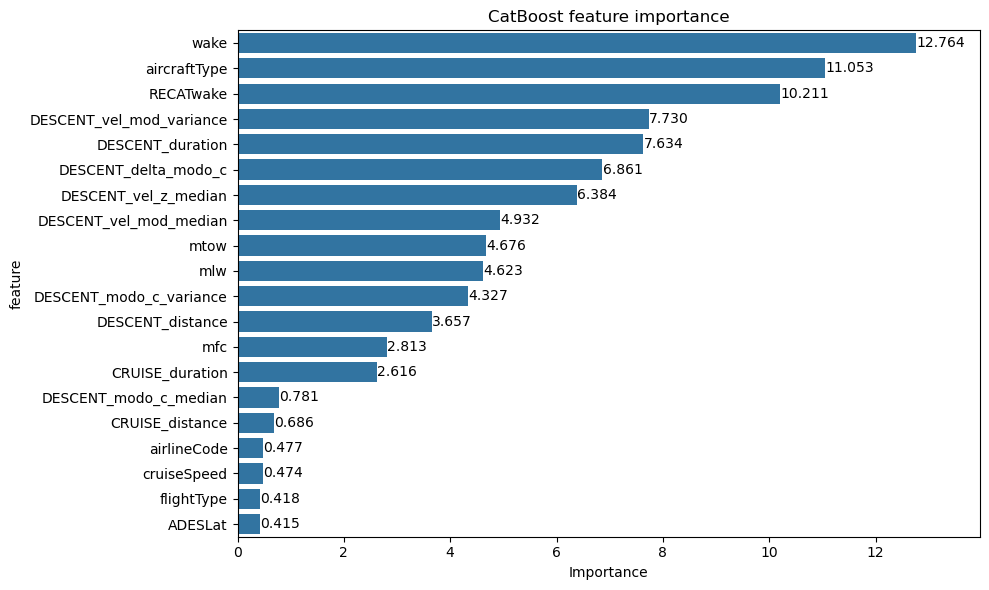

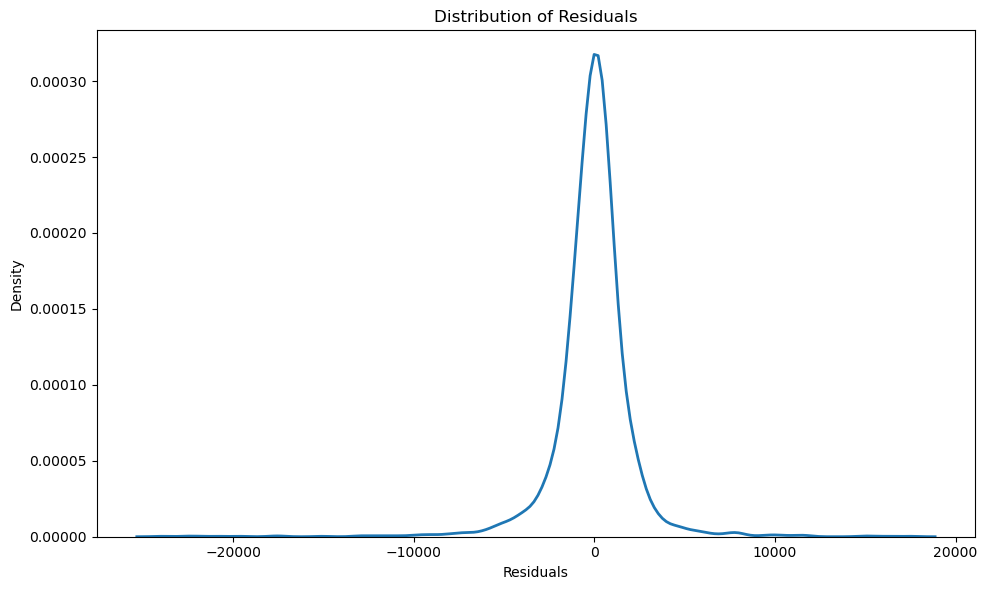

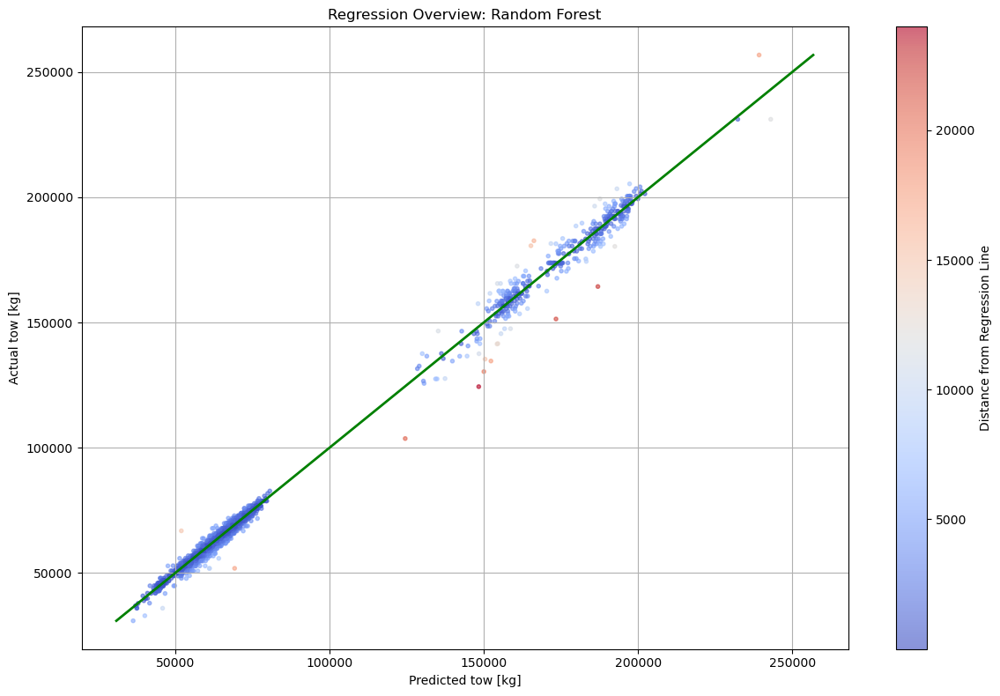

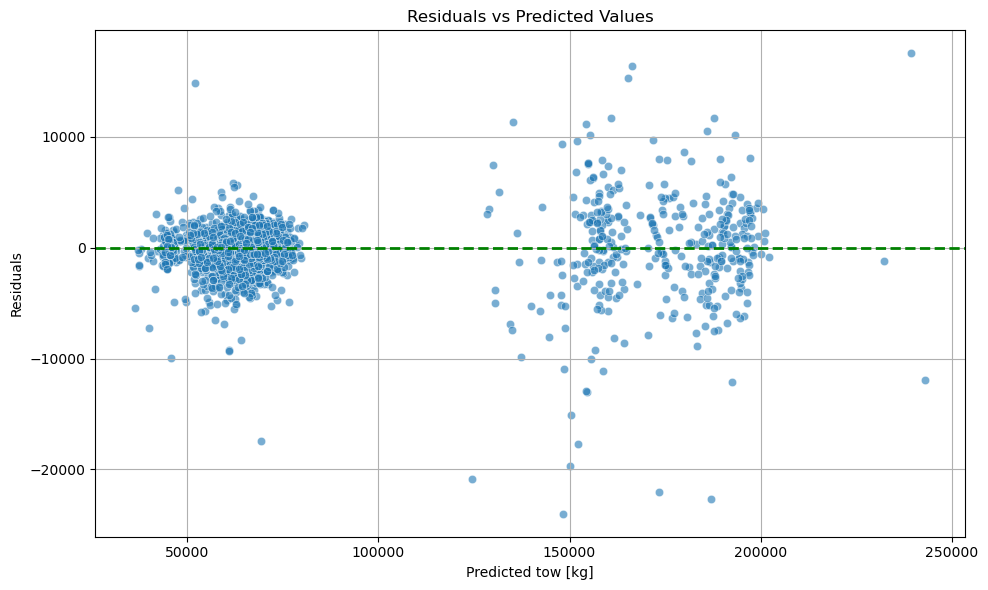

In [16]:
model_name = 'CatBoost'

with mlflow.start_run():
    mlflow.log_input(dataset_1, context="training")
    mlflow.log_artifact('dataset_1/' + "train_sample_" + model_name + ".csv", "dataset")
    mlflow.log_artifact('dataset_1/' + "test_sample_" + model_name + ".csv", "dataset")
    signature = mlflow.models.infer_signature(X_test, y_test)
    mlflow.sklearn.log_model(model, 'CatBoost_dataset_1_' + model_name, registered_model_name='CatBoost_dataset_1_' + model_name, signature=signature)
    mlflow.set_tag("mlflow.runName", "CatBoost_dataset_1")

    mlflow.log_param("ML_Algorithm", model_name)
    mlflow.log_param("Train_test_split", test_size)
    
    for param, value in model.get_params().items():
        mlflow.log_param(param, value)    

    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mlflow.log_metric("MAE", mae)
    mlflow.log_metric("RMSE", rmse)
    mlflow.log_metric("R2", r2)

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(data = feature_im_df[:20], x='importance', y='feature')

    for p in ax.patches:
        width = p.get_width()
        ax.text(width + 0.005,                # x-coordinate (slightly offset)
                p.get_y() + p.get_height() / 2,  # y-coordinate (center of bar)
                f'{width:.3f}',               # label text
                va='center')
    max_width = feature_im_df['importance'].head(20).max()
    ax.set_xlim(0, max_width + 1.2)  # Agrega margen derecho

    plt.title("CatBoost feature importance")
    plt.xlabel("Importance")
    plt.ylabel("feature")
    plt.tight_layout()
    plt.savefig('dataset_1/' + "feature_importance_" + model_name + ".png")

    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.kdeplot(residuals, linewidth=2)
    plt.title('Distribution of Residuals')
    plt.xlabel('Residuals')
    plt.ylabel('Density')
    plt.tight_layout()
    plt.savefig('dataset_1/' + "residuals_distribution_" + model_name + ".png")

    distances = np.abs(y_pred - y_test)
    norm = Normalize(vmin=0, vmax=np.max(distances))
    colors = plt.cm.coolwarm(norm(distances))  # colormap
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(x=y_pred, y=y_test, c=distances, cmap='coolwarm', marker='.', alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=2, label='Ideal')
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Actual tow [kg]')
    plt.title('Regression Overview: Random Forest')
    plt.grid(True)
    cbar = plt.colorbar(scatter)
    cbar.set_label('Distance from Regression Line')
    plt.tight_layout()
    plt.savefig('dataset_1/' + "regression_scatterplot_" + model_name + ".png")
    
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='green', linestyle='--', linewidth=2)
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted Values')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('dataset_1/' + "residuals_scatterplot_" + model_name + ".png")

    ## Upload the figures of the confusion matrix
    mlflow.log_artifact('dataset_1/' + "feature_importance_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_1/' + "residuals_distribution_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_1/' + "regression_scatterplot_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_1/' + "residuals_scatterplot_" + model_name + ".png",'Figures')

## Model 2

In [17]:
train_sample = pd.read_csv('dataset_2/train_sample_CatBoost.csv')
test_sample = pd.read_csv('dataset_2/test_sample_CatBoost.csv')

best_params = {'reg_lambda': 5.631325444164756,
 'random_strength': 13.670644178724121,
 'depth': 9,
 'min_data_in_leaf': 1,
 'leaf_estimation_iterations': 15}

model = CatBoostRegressor(
    iterations=20000,
    eval_metric=metrics.RMSE(),
    random_seed=42,
    logging_level='Silent',
    objective=metrics.RMSE(),
    task_type='CPU',
    use_best_model=True,
    od_type='Iter',
    od_wait=50,
    **best_params,
)

X_train = train_sample.drop(columns=['tow'])
y_train = train_sample['tow']

X_test = test_sample.drop(columns=['tow'])
y_test = test_sample['tow']

categorical_variables = ['routeType', 'flightType', 'wake', 'RECATwake', 'numberOfEngines', 'aircraftType', 'airlineCode']
train_pool = Pool(X_train, y_train, cat_features=categorical_variables)
test_pool = Pool(X_test, y_test, cat_features=categorical_variables)

model.fit(train_pool, eval_set=test_pool)

feature_importances = model.get_feature_importance(train_pool)
feature_names = X_train.columns

feature_im_df = pd.DataFrame({
    "feature": X_train.columns,
    "importance": feature_importances
})

feature_im_df = feature_im_df.sort_values(by="importance", ascending=False)

c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Successfully registered model 'CatBoost_dataset_2_CatBoost'.
2025/05/06 04:11:25 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: CatBoost_dat

🏃 View run CatBoost_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/21e644117fab4a0884f65e268882815f
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


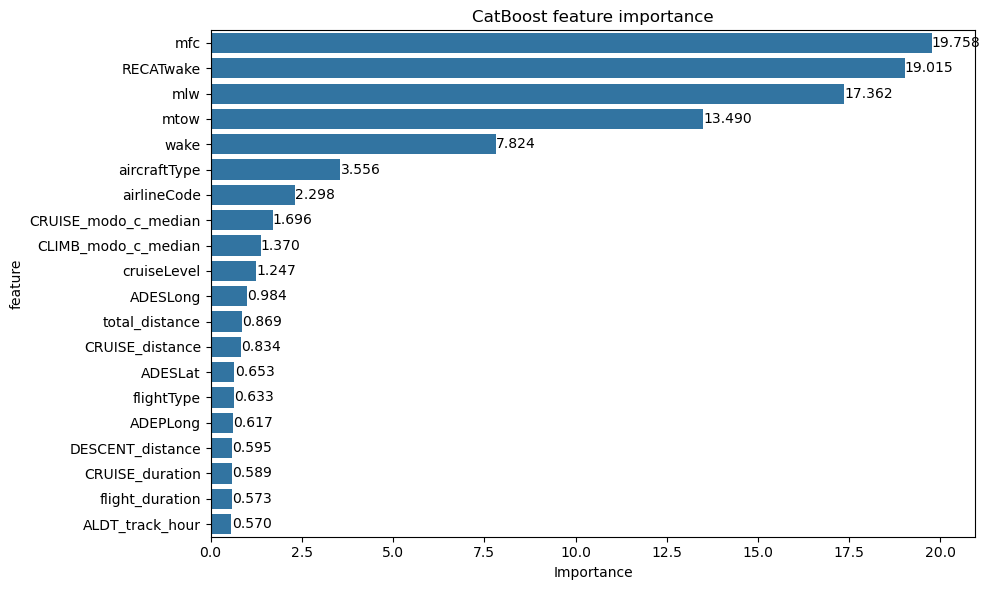

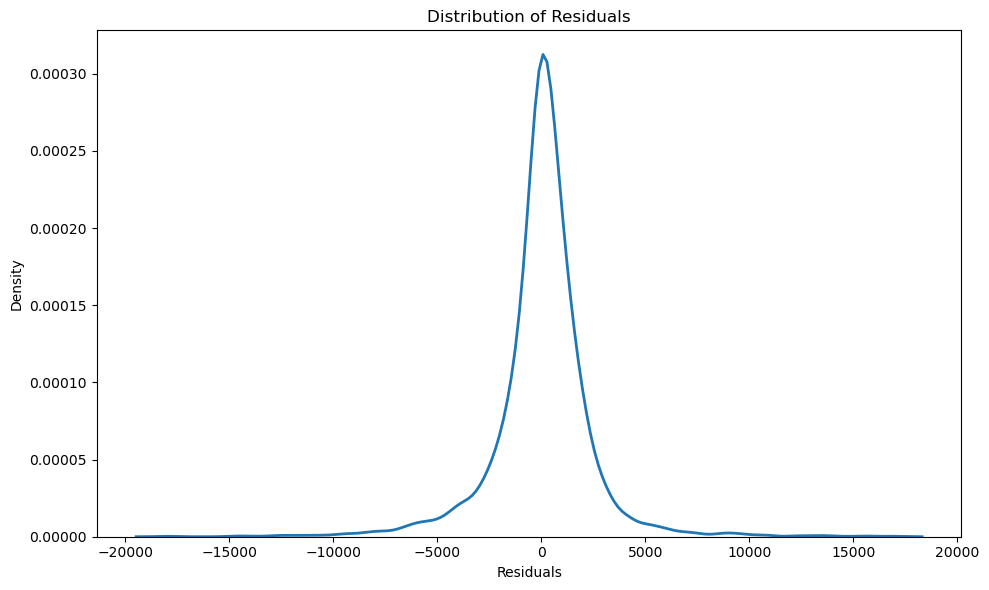

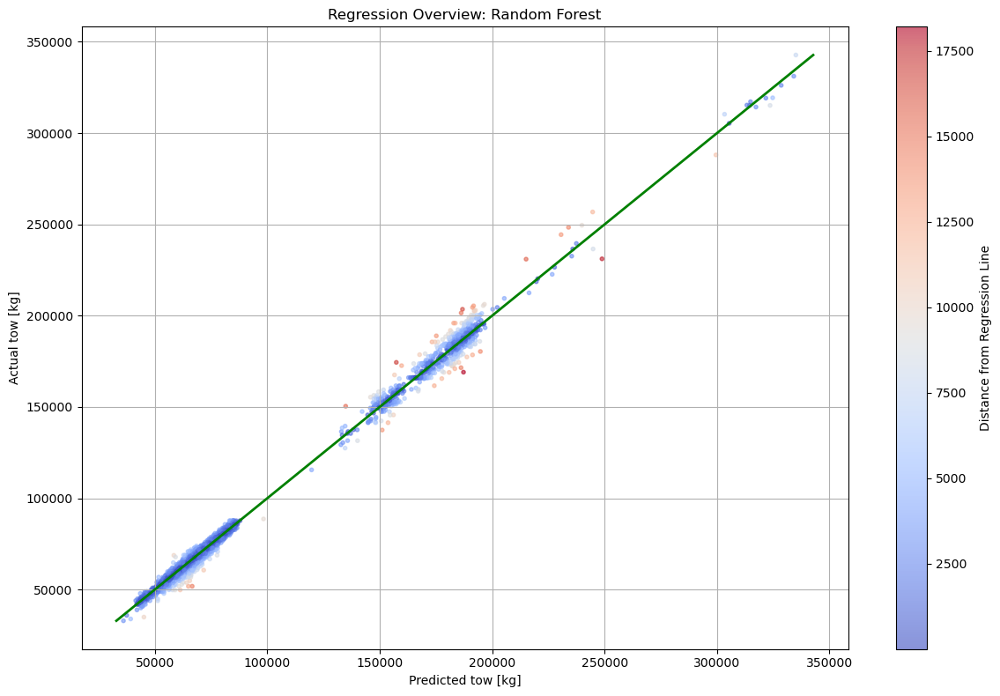

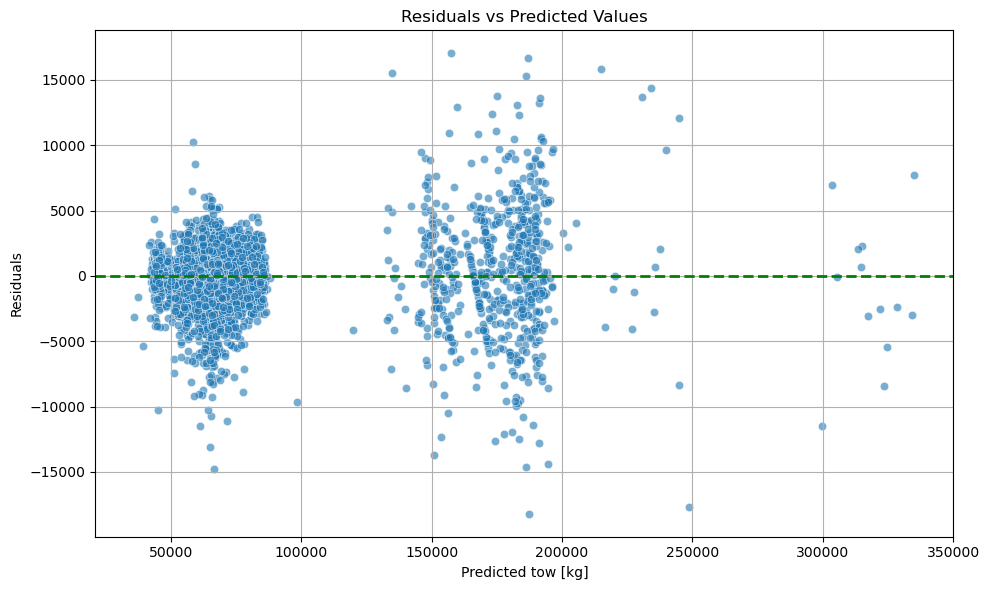

In [18]:
model_name = 'CatBoost'

with mlflow.start_run():
    mlflow.log_input(dataset_2, context="training")
    mlflow.log_artifact('dataset_2/' + "train_sample_" + model_name + ".csv", "dataset")
    mlflow.log_artifact('dataset_2/' + "test_sample_" + model_name + ".csv", "dataset")
    signature = mlflow.models.infer_signature(X_test, y_test)
    mlflow.sklearn.log_model(model, 'CatBoost_dataset_2_' + model_name, registered_model_name='CatBoost_dataset_2_' + model_name, signature=signature)
    mlflow.set_tag("mlflow.runName", "CatBoost_dataset_2")

    mlflow.log_param("ML_Algorithm", model_name)
    mlflow.log_param("Train_test_split", test_size)
    
    for param, value in model.get_params().items():
        mlflow.log_param(param, value)    

    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mlflow.log_metric("MAE", mae)
    mlflow.log_metric("RMSE", rmse)
    mlflow.log_metric("R2", r2)

    plt.figure(figsize=(10, 6))
    ax = sns.barplot(data = feature_im_df[:20], x='importance', y='feature')

    for p in ax.patches:
        width = p.get_width()
        ax.text(width + 0.005,                # x-coordinate (slightly offset)
                p.get_y() + p.get_height() / 2,  # y-coordinate (center of bar)
                f'{width:.3f}',               # label text
                va='center')
    max_width = feature_im_df['importance'].head(20).max()
    ax.set_xlim(0, max_width + 1.2)  # Agrega margen derecho

    plt.title("CatBoost feature importance")
    plt.xlabel("Importance")
    plt.ylabel("feature")
    plt.tight_layout()
    plt.savefig('dataset_2/' + "feature_importance_" + model_name + ".png")

    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.kdeplot(residuals, linewidth=2)
    plt.title('Distribution of Residuals')
    plt.xlabel('Residuals')
    plt.ylabel('Density')
    plt.tight_layout()
    plt.savefig('dataset_2/' + "residuals_distribution_" + model_name + ".png")

    distances = np.abs(y_pred - y_test)
    norm = Normalize(vmin=0, vmax=np.max(distances))
    colors = plt.cm.coolwarm(norm(distances))  # colormap
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(x=y_pred, y=y_test, c=distances, cmap='coolwarm', marker='.', alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=2, label='Ideal')
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Actual tow [kg]')
    plt.title('Regression Overview: Random Forest')
    plt.grid(True)
    cbar = plt.colorbar(scatter)
    cbar.set_label('Distance from Regression Line')
    plt.tight_layout()
    plt.savefig('dataset_2/' + "regression_scatterplot_" + model_name + ".png")
    
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='green', linestyle='--', linewidth=2)
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted Values')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('dataset_2/' + "residuals_scatterplot_" + model_name + ".png")

    ## Upload the figures of the confusion matrix
    mlflow.log_artifact('dataset_2/' + "feature_importance_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_2/' + "residuals_distribution_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_2/' + "regression_scatterplot_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_2/' + "residuals_scatterplot_" + model_name + ".png",'Figures')

# LightGBM

## Model 1

In [21]:
train_sample = pd.read_csv('dataset_1/train_sample_LightGBM.csv')
test_sample = pd.read_csv('dataset_1/test_sample_LightGBM.csv')

best_params = {'learning_rate': 0.012573069958995145,
 'num_leaves': 41,
 'max_depth': 8,
 'min_child_weight': 9,
 'reg_alpha': 0.009807699549944683,
 'reg_lambda': 4.4977845070800795,
 'colsample_bytree': 0.9257327235011917,
 'subsample': 0.6642137516216695}

categorical_variables = ['routeType', 'flightType', 'wake', 'RECATwake', 'numberOfEngines', 'aircraftType', 'airlineCode']

X_train = train_sample.drop(columns=['tow'])
y_train = train_sample['tow']
for col in categorical_variables:
    if col in X_train.columns:
        X_train[col] = X_train[col].astype('category')

X_test = test_sample.drop(columns=['tow'])
y_test = test_sample['tow']
for col in categorical_variables:
    if col in X_test.columns:
        X_test[col] = X_test[col].astype('category')

train_data = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_variables, free_raw_data=False)
test_data = lgb.Dataset(X_test, label=y_test, categorical_feature=categorical_variables, free_raw_data=False)

model = lgb.train(
    best_params,
    train_data,
    valid_sets=[test_data],
    valid_names=['valid'],
    num_boost_round=10000,
    callbacks=[
        early_stopping(stopping_rounds=50),
        log_evaluation(period=100)
    ]
)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009916 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12169
[LightGBM] [Info] Number of data points in the train set: 13155, number of used features: 72
[LightGBM] [Info] Start training from score 77005.639873
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

Registered model 'LightGBM_dataset_1_LightGBM' already exists. Creating a new version of this model...
2025/05/06 04:42:31 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LightGBM_dataset_1_LightGBM, version 3
Created version '3' of model 'LightGBM_dataset_1_LightGBM'.


🏃 View run LightGBM_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/ed73fe7ae5f04e45a286b2556d298c25
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


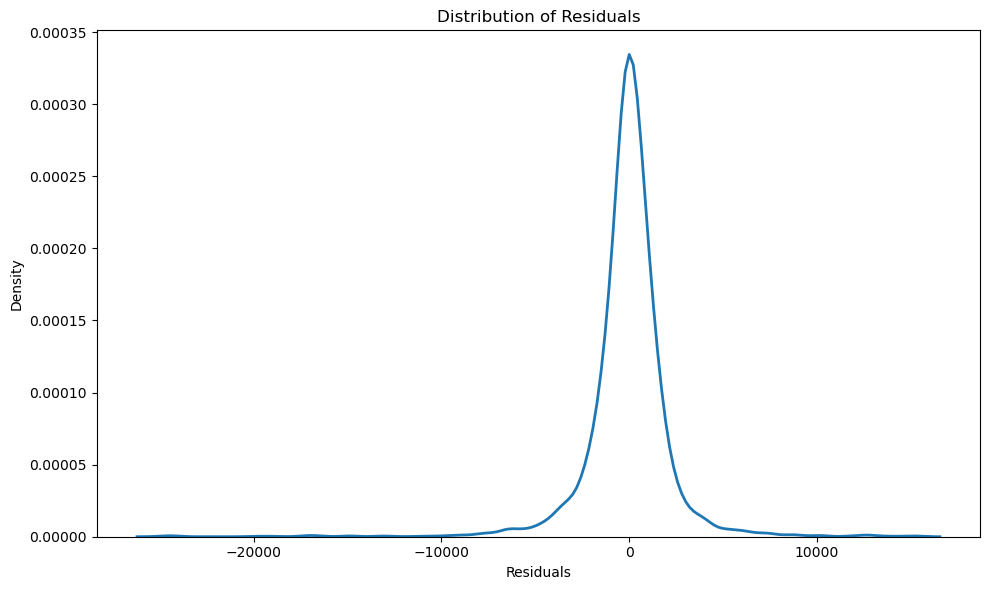

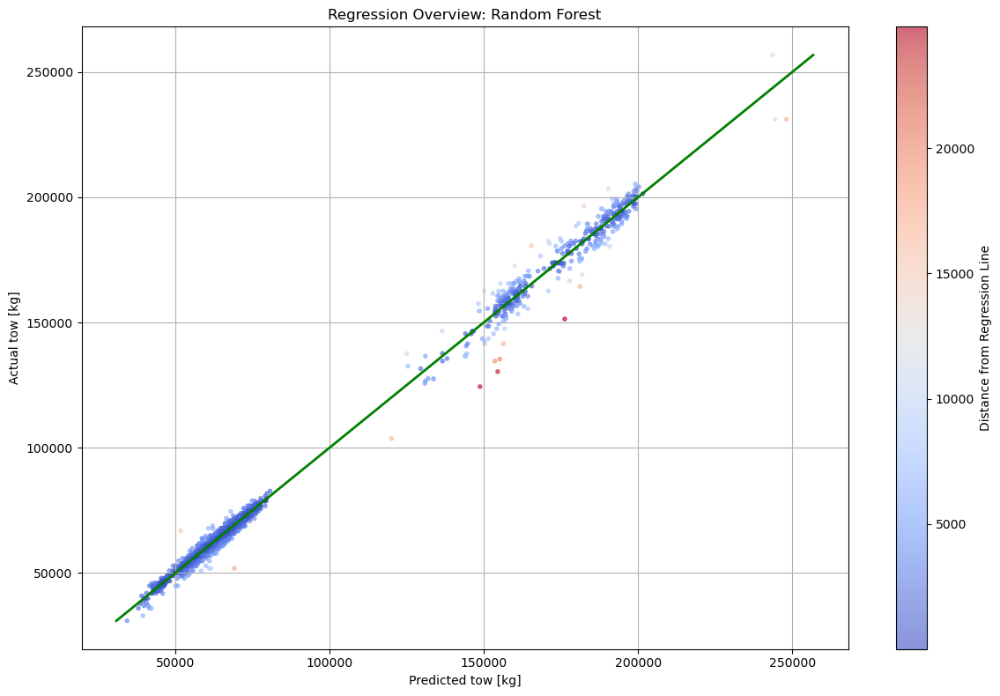

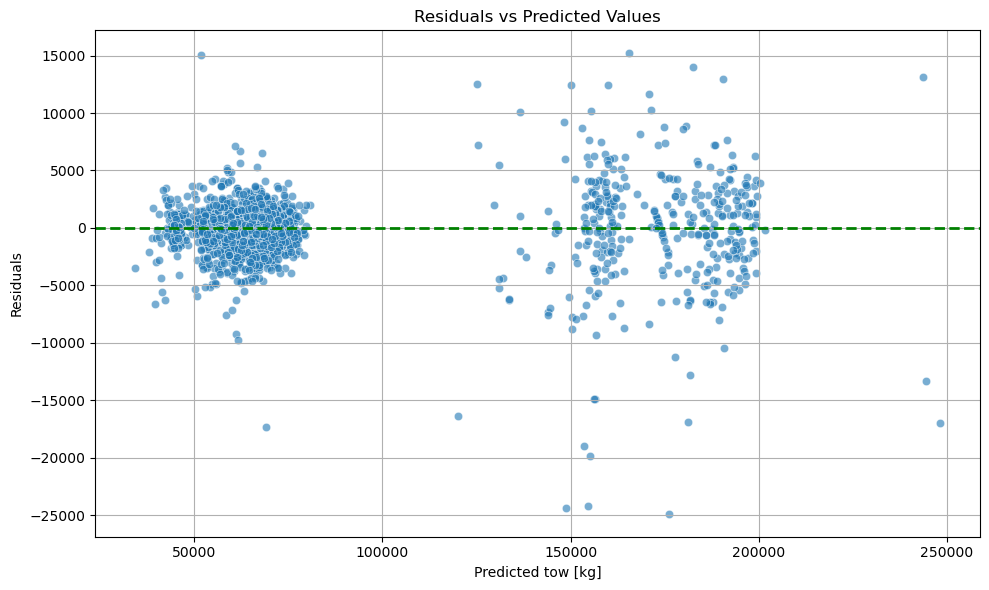

In [28]:
model_name = 'LightGBM'

with mlflow.start_run():
    mlflow.log_input(dataset_1, context="training")
    mlflow.log_artifact('dataset_1/' + "train_sample_" + model_name + ".csv", "dataset")
    mlflow.log_artifact('dataset_1/' + "test_sample_" + model_name + ".csv", "dataset")
    signature = mlflow.models.infer_signature(X_test, y_test)
    mlflow.sklearn.log_model(model, 'LightGBM_dataset_1_' + model_name, registered_model_name='LightGBM_dataset_1_' + model_name, signature=signature)
    mlflow.set_tag("mlflow.runName", "LightGBM_dataset_1")

    mlflow.log_param("ML_Algorithm", model_name)
    mlflow.log_param("Train_test_split", test_size)
    
    for param, value in model.params.items():
        mlflow.log_param(param, value)    

    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mlflow.log_metric("MAE", mae)
    mlflow.log_metric("RMSE", rmse)
    mlflow.log_metric("R2", r2)

    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.kdeplot(residuals, linewidth=2)
    plt.title('Distribution of Residuals')
    plt.xlabel('Residuals')
    plt.ylabel('Density')
    plt.tight_layout()
    plt.savefig('dataset_1/' + "residuals_distribution_" + model_name + ".png")

    distances = np.abs(y_pred - y_test)
    norm = Normalize(vmin=0, vmax=np.max(distances))
    colors = plt.cm.coolwarm(norm(distances))  # colormap
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(x=y_pred, y=y_test, c=distances, cmap='coolwarm', marker='.', alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=2, label='Ideal')
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Actual tow [kg]')
    plt.title('Regression Overview: Random Forest')
    plt.grid(True)
    cbar = plt.colorbar(scatter)
    cbar.set_label('Distance from Regression Line')
    plt.tight_layout()
    plt.savefig('dataset_1/' + "regression_scatterplot_" + model_name + ".png")
    
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='green', linestyle='--', linewidth=2)
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted Values')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('dataset_1/' + "residuals_scatterplot_" + model_name + ".png")

    mlflow.log_artifact('dataset_1/' + "residuals_distribution_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_1/' + "regression_scatterplot_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_1/' + "residuals_scatterplot_" + model_name + ".png",'Figures')

## Model 2

In [29]:
train_sample = pd.read_csv('dataset_2/train_sample_LightGBM.csv')
test_sample = pd.read_csv('dataset_2/test_sample_LightGBM.csv')

best_params = {'learning_rate': 0.012563762388600762,
'num_leaves': 94,
'max_depth': 7,
'min_child_weight': 10,
'reg_alpha': 0.08280417499268101,
'reg_lambda': 6.231514149060283,
'colsample_bytree': 0.9638904435735209,
'subsample': 0.8369124868848481}

categorical_variables = ['routeType', 'flightType', 'wake', 'RECATwake', 'numberOfEngines', 'aircraftType', 'airlineCode']

X_train = train_sample.drop(columns=['tow'])
y_train = train_sample['tow']
for col in categorical_variables:
    if col in X_train.columns:
        X_train[col] = X_train[col].astype('category')

X_test = test_sample.drop(columns=['tow'])
y_test = test_sample['tow']
for col in categorical_variables:
    if col in X_test.columns:
        X_test[col] = X_test[col].astype('category')

train_data = lgb.Dataset(X_train, label=y_train, categorical_feature=categorical_variables, free_raw_data=False)
test_data = lgb.Dataset(X_test, label=y_test, categorical_feature=categorical_variables, free_raw_data=False)

model = lgb.train(
    best_params,
    train_data,
    valid_sets=[test_data],
    valid_names=['valid'],
    num_boost_round=10000,
    callbacks=[
        early_stopping(stopping_rounds=50),
        log_evaluation(period=100)
    ]
)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.033446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 12169
[LightGBM] [Info] Number of data points in the train set: 13155, number of used features: 72
[LightGBM] [Info] Start training from score 77005.639873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 50 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Successfully registered model 'LightGBM_dataset_2_LightGBM'.
2025/05/06 04:47:14 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LightGBM_dat

🏃 View run LightGBM_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/4724fc57eddf4734b25442178282eba4
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


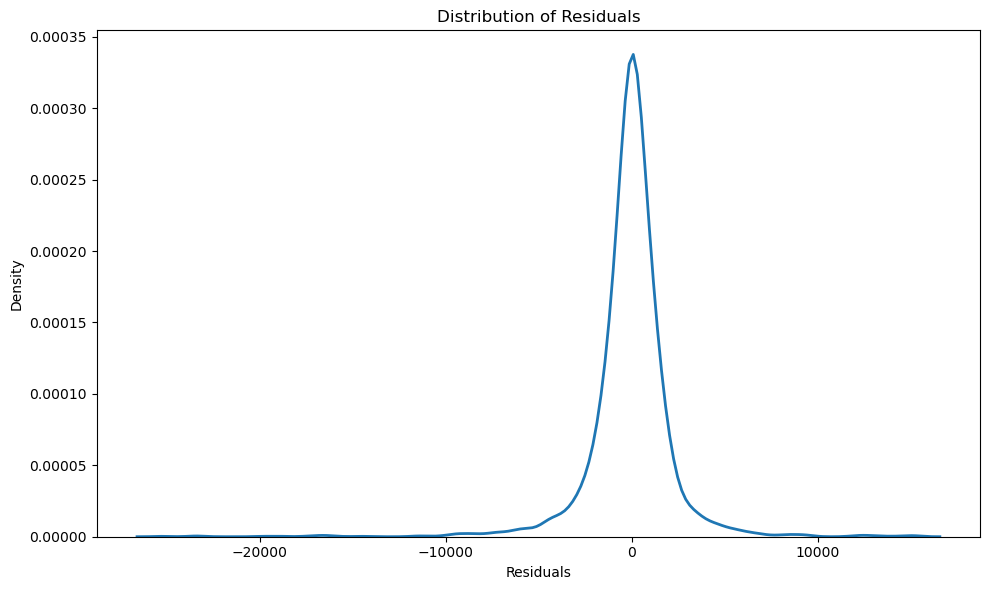

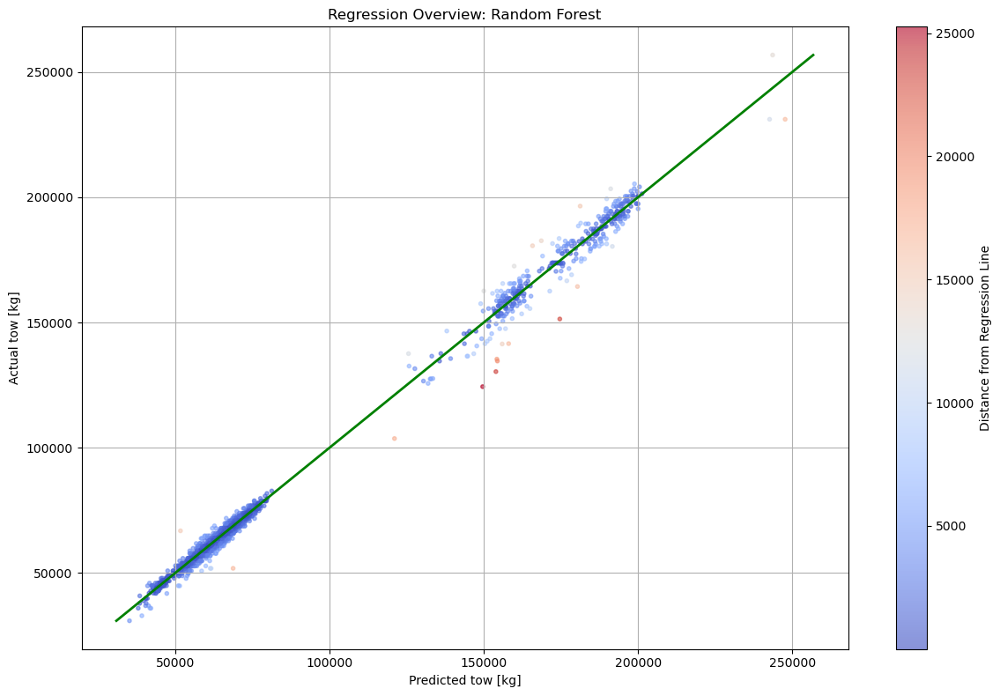

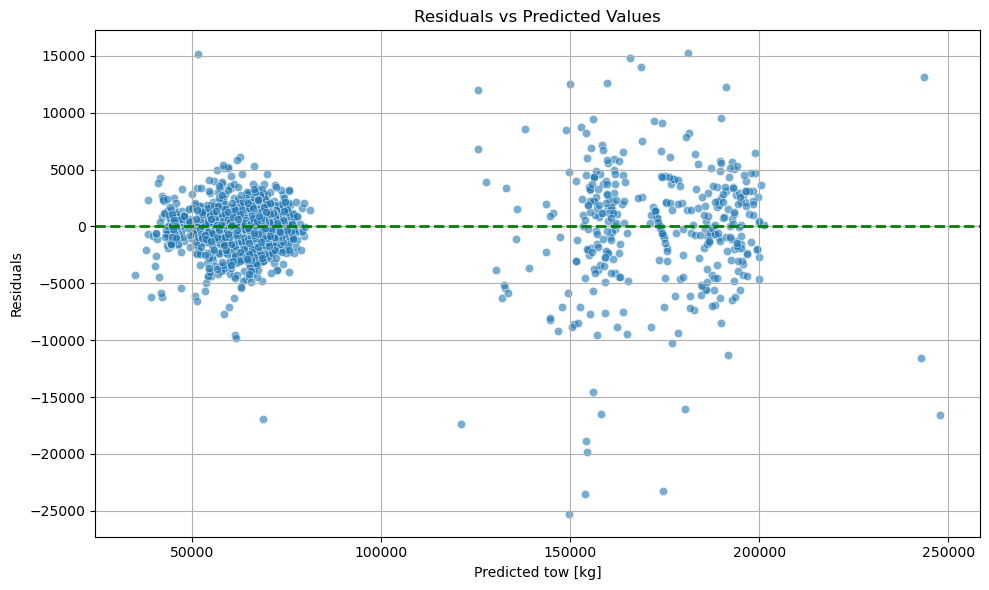

In [30]:
model_name = 'LightGBM'

with mlflow.start_run():
    mlflow.log_input(dataset_2, context="training")
    mlflow.log_artifact('dataset_2/' + "train_sample_" + model_name + ".csv", "dataset")
    mlflow.log_artifact('dataset_2/' + "test_sample_" + model_name + ".csv", "dataset")
    signature = mlflow.models.infer_signature(X_test, y_test)
    mlflow.sklearn.log_model(model, 'LightGBM_dataset_2_' + model_name, registered_model_name='LightGBM_dataset_2_' + model_name, signature=signature)
    mlflow.set_tag("mlflow.runName", "LightGBM_dataset_2")

    mlflow.log_param("ML_Algorithm", model_name)
    mlflow.log_param("Train_test_split", test_size)
    
    for param, value in model.params.items():
        mlflow.log_param(param, value)    

    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mlflow.log_metric("MAE", mae)
    mlflow.log_metric("RMSE", rmse)
    mlflow.log_metric("R2", r2)

    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.kdeplot(residuals, linewidth=2)
    plt.title('Distribution of Residuals')
    plt.xlabel('Residuals')
    plt.ylabel('Density')
    plt.tight_layout()
    plt.savefig('dataset_2/' + "residuals_distribution_" + model_name + ".png")

    distances = np.abs(y_pred - y_test)
    norm = Normalize(vmin=0, vmax=np.max(distances))
    colors = plt.cm.coolwarm(norm(distances))  # colormap
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(x=y_pred, y=y_test, c=distances, cmap='coolwarm', marker='.', alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=2, label='Ideal')
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Actual tow [kg]')
    plt.title('Regression Overview: Random Forest')
    plt.grid(True)
    cbar = plt.colorbar(scatter)
    cbar.set_label('Distance from Regression Line')
    plt.tight_layout()
    plt.savefig('dataset_2/' + "regression_scatterplot_" + model_name + ".png")
    
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
    plt.axhline(0, color='green', linestyle='--', linewidth=2)
    plt.xlabel('Predicted tow [kg]')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted Values')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig('dataset_2/' + "residuals_scatterplot_" + model_name + ".png")

    mlflow.log_artifact('dataset_2/' + "residuals_distribution_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_2/' + "regression_scatterplot_" + model_name + ".png",'Figures')
    mlflow.log_artifact('dataset_2/' + "residuals_scatterplot_" + model_name + ".png",'Figures')

# AutoML

## Model 1

In [37]:
train_sample = h2o.import_file('dataset_1/train_sample_CatBoost.csv')
test_sample = h2o.import_file('dataset_1/test_sample_CatBoost.csv')

X = train_sample.columns
y = "tow"
X.remove(y)

X_train = train_sample.drop(len(train_sample.col_names)-1)
y_train = train_sample['tow']
X_train = X_train.as_data_frame()
y_train = y_train.as_data_frame()['tow'].values

X_test = test_sample.drop(len(test_sample.col_names)-1)
y_test = test_sample['tow']
X_test = X_test.as_data_frame()
y_test = y_test.as_data_frame()['tow'].values

aml = H2OAutoML(max_models=20, seed=1)
aml.train(x=X, y=y, training_frame=train_sample)

lb = aml.leaderboard
lb.head(rows=lb.nrows)  # Print all rows instead of default (10 rows)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever t

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run StackedEnsemble_AllModels_1_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/99b3ff7fc6494646b7be311c0d8b324a
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:38:40 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp7hg63m9v\model\model.pkl, flavor: sklearn). Fal

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run StackedEnsemble_BestOfFamily_1_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/e85257a994584e0dbe0bf17034a529f4
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:39:06 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpsrq0rvt4\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_2_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/84eaa0edc7a54387a21ebe0160366d0a
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:39:34 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp2h2sbymq\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_5_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/6d6306fea558405da5abd2642434b709
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:40:01 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp86ukujnz\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_4_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/61f6745a603a4258aa5fdf9481a45676
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:40:28 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpi0f0zdr9\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_3_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/29d798a193b84cbaa287617a5aead2f9
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:40:54 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp2nh0wdch\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"
C:\Users\jaguevara\AppData\Local\Temp\ipykernel_20072\717418075.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotl

🏃 View run GBM_grid_1_AutoML_1_20250506_53342_model_4_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/51c6d1a4da7540418ec1b561e0adb663
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:41:22 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpn6o0kxqp\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_grid_1_AutoML_1_20250506_53342_model_2_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/d3f5be4df4ed475380b3f0504a8637e8
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:41:47 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpzvq2_k0j\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_grid_1_AutoML_1_20250506_53342_model_1_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/f9458a5f69f14f6c83af4fd9b596b1f3
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:42:17 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp5vunsi4d\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_1_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/0c38c65cd2344c74aff0f506d9b4c2ce
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:42:50 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpx5ow267k\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_grid_1_AutoML_1_20250506_53342_model_5_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/8b3598c7af9a4031874fb58bc9970ac8
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:43:16 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpkzgl2ctd\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_grid_1_AutoML_1_20250506_53342_model_3_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/e4e97eef3ca24fca94b57265926df06e
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:43:44 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpp7d3afc5\model\model.pkl, flavor: sklearn). Fal

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run XRT_1_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/63b3cbbb3ded4399af43c7969aaedca4
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:44:11 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpalti0m5u\model\model.pkl, flavor: sklearn). Fal

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DRF_1_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/c63ae34fc6ff47e89d592b54731696e2
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:44:37 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpv42il1h3\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_1_AutoML_1_20250506_53342_model_1_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/d1d913b7a08d47a0bb9e100253619a77
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:45:05 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp0uegtggm\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_2_AutoML_1_20250506_53342_model_1_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/69be541447054f838de11a3779a5df3a
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:45:35 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpv4bwqhmc\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_1_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/5f4ef94423c740a4a0d54dd969eb01f5
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:46:04 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpk1v7osus\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_3_AutoML_1_20250506_53342_model_1_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/2212fd4a1a434acfb9ae2729a990cd89
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:46:33 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp9zn1a0gk\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_1_AutoML_1_20250506_53342_model_2_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/12d4bd5594434a70891fac2cca06c748
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:46:58 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmptwf7aex1\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_3_AutoML_1_20250506_53342_model_2_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/ab19b95e83a54e31aaca2392f6fd033b
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:47:26 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpr2l_83j6\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_2_AutoML_1_20250506_53342_model_2_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/6d8d7761c5a149d197853f5f3fdbaa76
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 10:47:53 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpuw14rdv_\model\model.pkl, flavor: sklearn). Fal

glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'aircraftType' has levels not trained on: ["A332"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\job.py:81: UserWarning: Test/Validation dataset column 'airlineCode' has levels not trained on: ["AEA"]
  warnings.warn(w)
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GLM_1_AutoML_1_20250506_53342_dataset_1 at: http://192.168.25.110:5000/#/experiments/55/runs/724b0ddb8dbd4f01bdff9c8ee43f94a6
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


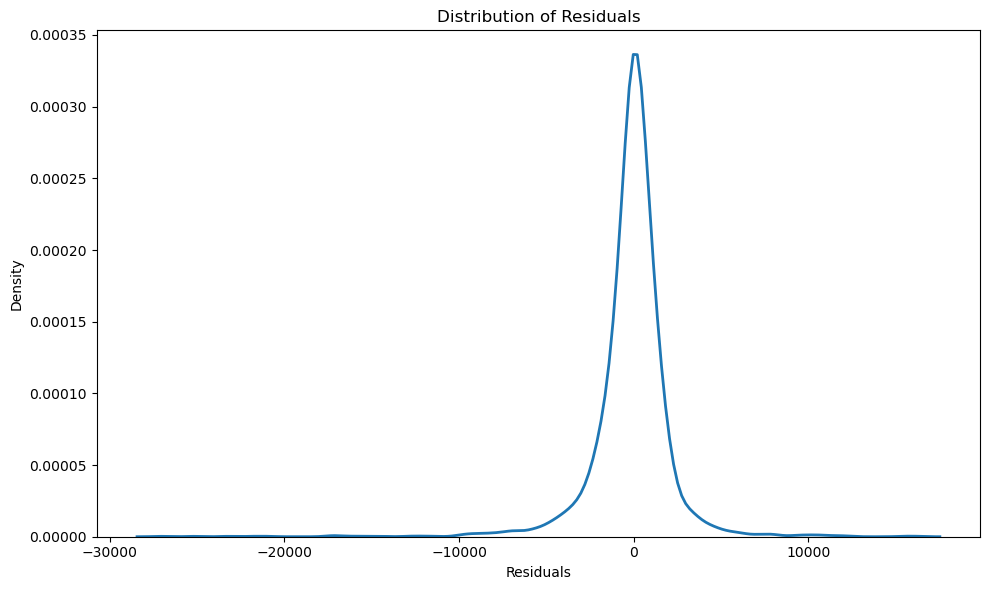

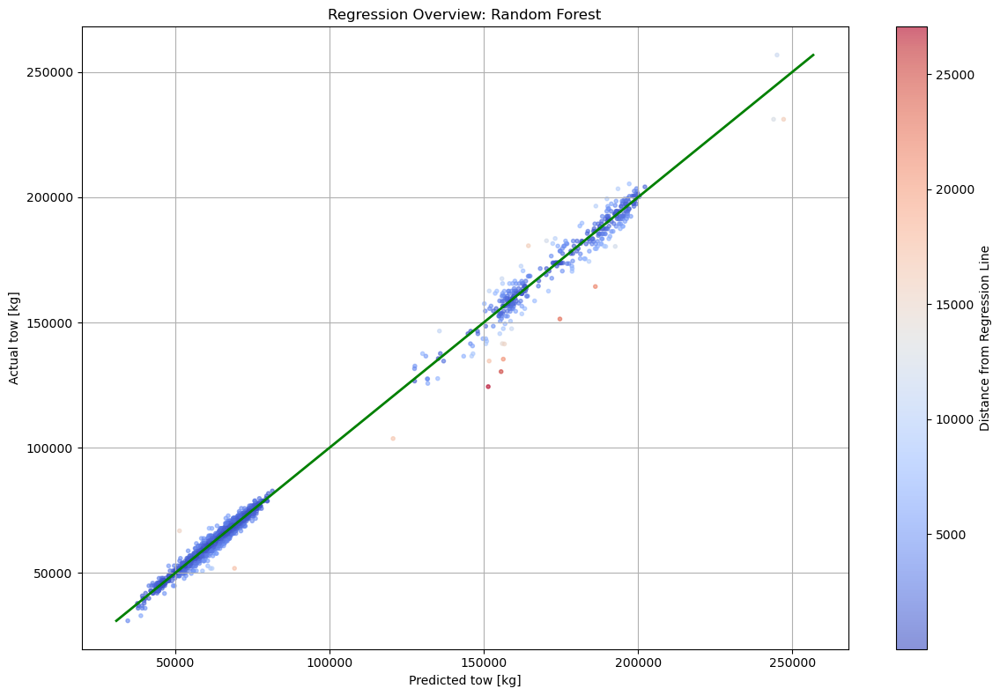

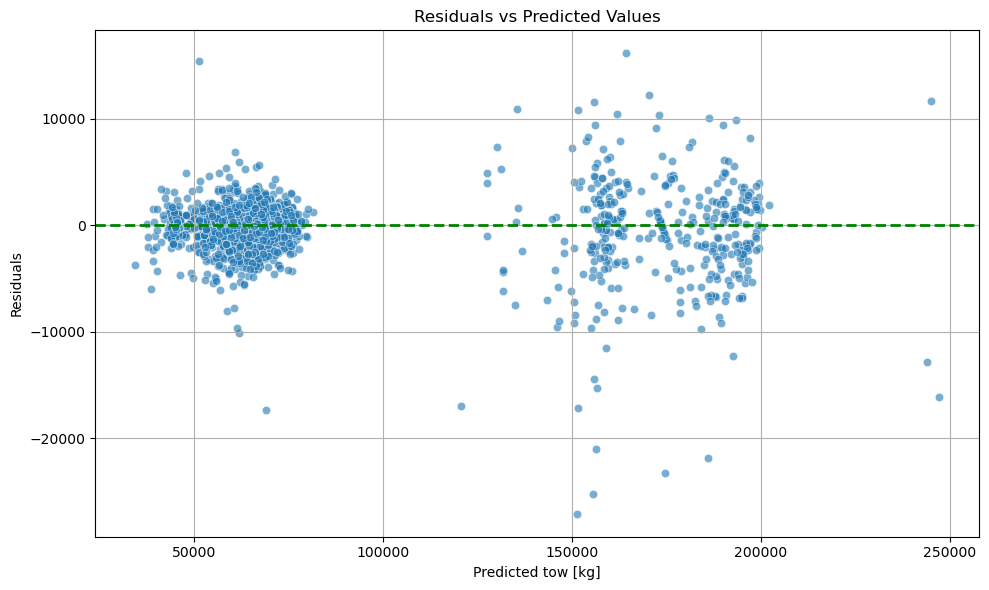

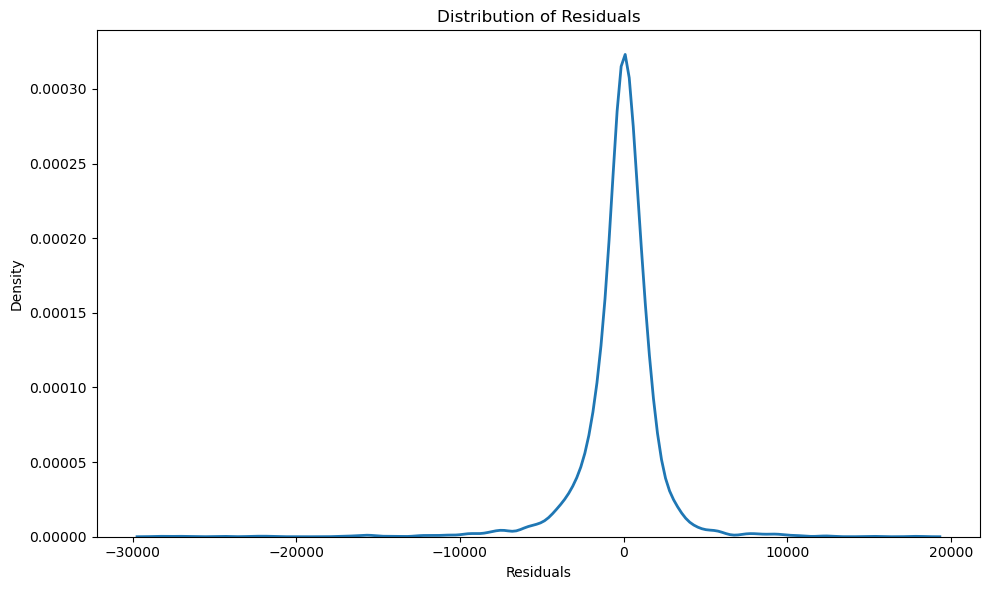

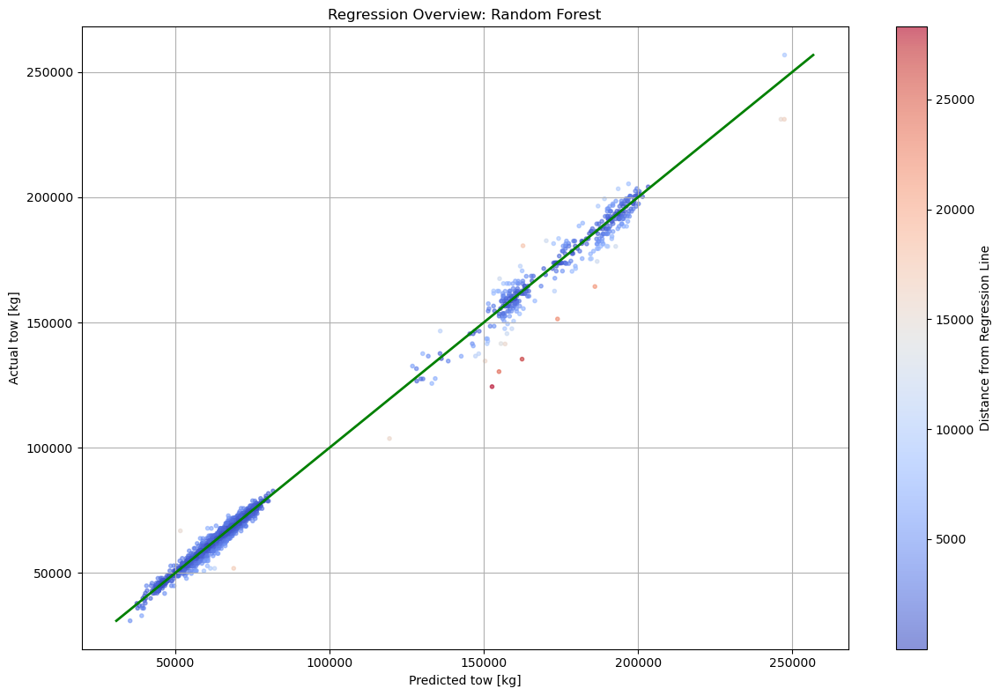

...

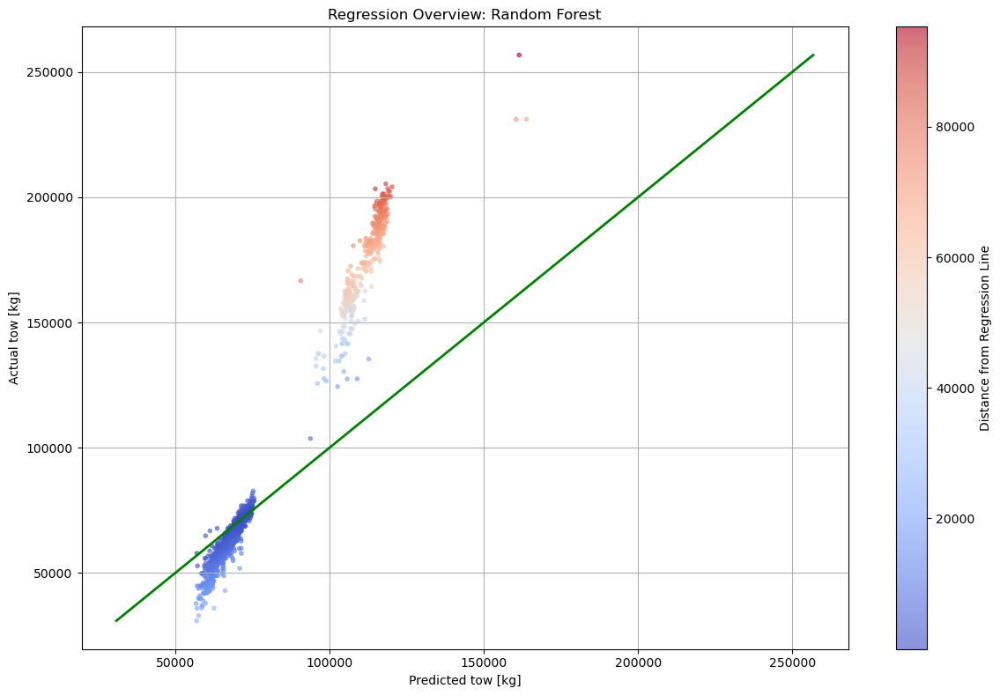

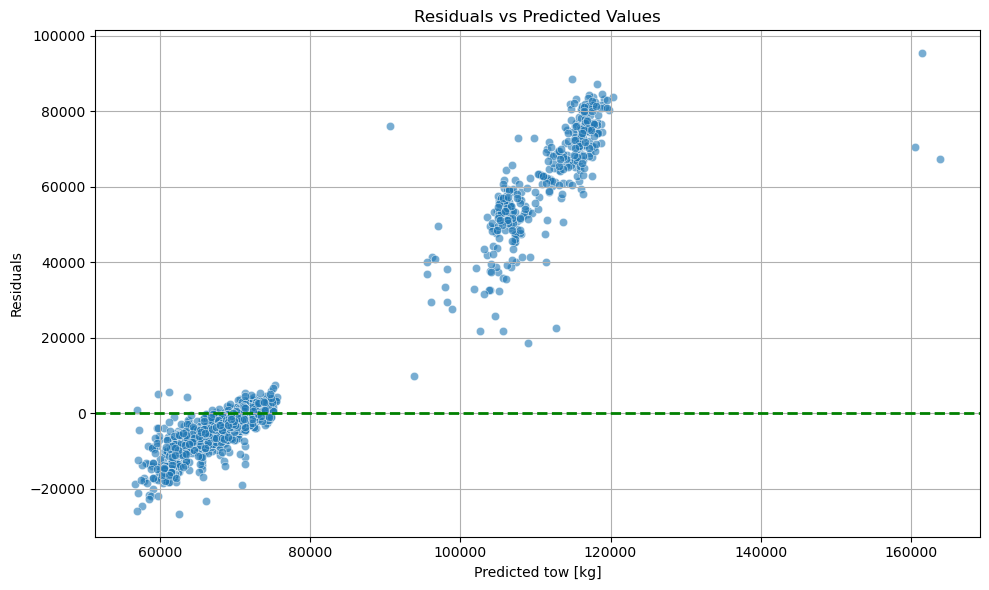

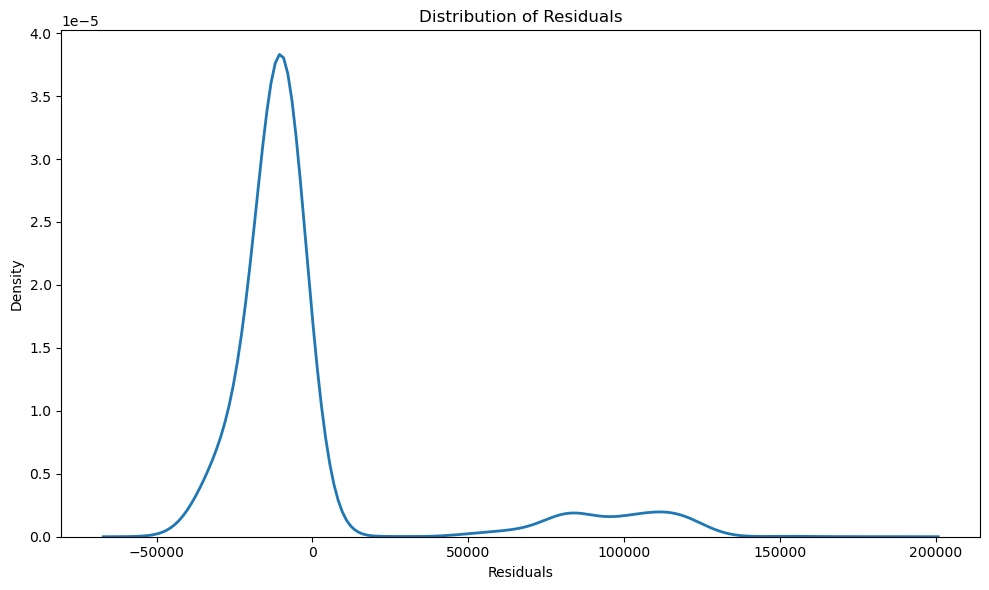

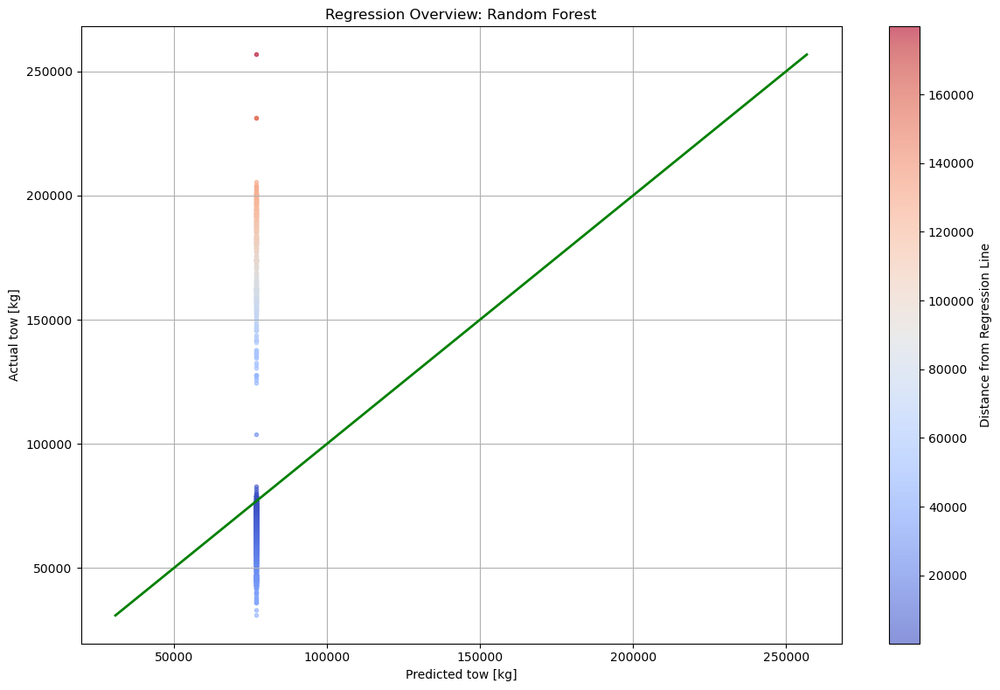

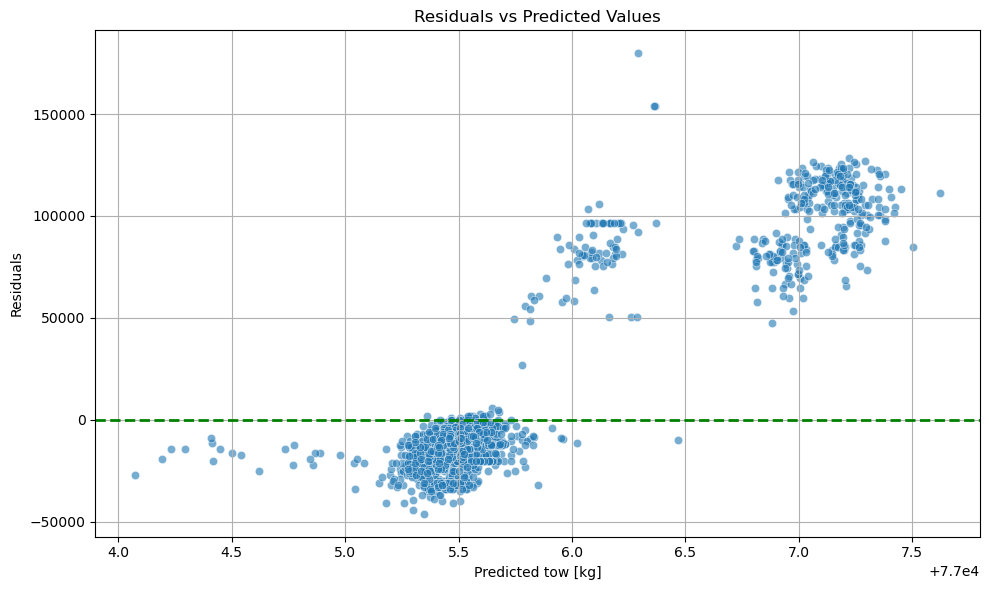

In [135]:
for name in aml.leaderboard.as_data_frame()['model_id']:
    model_name = name
    with mlflow.start_run():
        mlflow.log_input(dataset_1, context="training")
        mlflow.log_artifact('dataset_1/train_sample_CatBoost.csv', "dataset")
        mlflow.log_artifact('dataset_1/test_sample_CatBoost.csv', "dataset")
        signature = mlflow.models.infer_signature(X_test, y_test)
        model = h2o.get_model(model_name)
        mlflow.h2o.log_model(model, model_name + '_dataset_1', signature=signature)
        mlflow.set_tag("mlflow.runName", model_name + '_dataset_1')
        
        mlflow.log_param("ML_Algorithm", model_name)
        mlflow.log_param("Train_test_split", test_size)
        
        # try:
        #     for param, value in model.params.items():
        #         mlflow.log_param(param, value)  
        # except:
        #     mlflow.log_params(model.params)
        
        mlflow.log_params(model.params)
                                  
        y_pred = model.predict(test_sample)
        y_pred = y_pred.as_data_frame()['predict'].values
        cv_perf = model.model_performance(xval=True)
        mlflow.log_metric("MAE", cv_perf.mae())
        mlflow.log_metric("RMSE", cv_perf.rmse())
        mlflow.log_metric("R2", cv_perf.r2())
        
        residuals = y_test - y_pred
        plt.figure(figsize=(10, 6))
        sns.kdeplot(residuals, linewidth=2)
        plt.title('Distribution of Residuals')
        plt.xlabel('Residuals')
        plt.ylabel('Density')
        plt.tight_layout()
        plt.savefig('dataset_1/' + "residuals_distribution_" + model_name + ".png")
        
        distances = np.abs(y_pred - y_test)
        norm = Normalize(vmin=0, vmax=np.max(distances))
        colors = plt.cm.coolwarm(norm(distances))  # colormap
        plt.figure(figsize=(12, 8))
        scatter = plt.scatter(x=y_pred, y=y_test, c=distances, cmap='coolwarm', marker='.', alpha=0.6)
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=2, label='Ideal')
        plt.xlabel('Predicted tow [kg]')
        plt.ylabel('Actual tow [kg]')
        plt.title('Regression Overview: Random Forest')
        plt.grid(True)
        cbar = plt.colorbar(scatter)
        cbar.set_label('Distance from Regression Line')
        plt.tight_layout()
        plt.savefig('dataset_1/' + "regression_scatterplot_" + model_name + ".png")
        
        residuals = y_test - y_pred
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
        plt.axhline(0, color='green', linestyle='--', linewidth=2)
        plt.xlabel('Predicted tow [kg]')
        plt.ylabel('Residuals')
        plt.title('Residuals vs Predicted Values')
        plt.grid(True)
        plt.tight_layout()
        plt.savefig('dataset_1/' + "residuals_scatterplot_" + model_name + ".png")

        mlflow.log_artifact('dataset_1/' + "residuals_distribution_" + model_name + ".png",'Figures')
        mlflow.log_artifact('dataset_1/' + "regression_scatterplot_" + model_name + ".png",'Figures')
        mlflow.log_artifact('dataset_1/' + "residuals_scatterplot_" + model_name + ".png",'Figures')        
                

## Model 2

In [136]:
train_sample = h2o.import_file('dataset_2/train_sample_CatBoost.csv')
test_sample = h2o.import_file('dataset_2/test_sample_CatBoost.csv')

X = train_sample.columns
y = "tow"
X.remove(y)

X_train = train_sample.drop(len(train_sample.col_names)-1)
y_train = train_sample['tow']
X_train = X_train.as_data_frame()
y_train = y_train.as_data_frame()['tow'].values

X_test = test_sample.drop(len(test_sample.col_names)-1)
y_test = test_sample['tow']
X_test = X_test.as_data_frame()
y_test = y_test.as_data_frame()['tow'].values

aml = H2OAutoML(max_models=20, seed=1)
aml.train(x=X, y=y, training_frame=train_sample)

lb = aml.leaderboard
lb.head(rows=lb.nrows)  # Print all rows instead of default (10 rows)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe us

AutoML progress: |
10:52:26.977: AutoML: XGBoost is not available; skipping it.

███████████████████████████████████████████████████████████████| (done) 100%


model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_1_AutoML_2_20250506_105226,2506.54,6.28272e+06,1482.93,0.027981,6.28272e+06
StackedEnsemble_BestOfFamily_1_AutoML_2_20250506_105226,2564.22,6.57524e+06,1514.95,0.0288851,6.57524e+06
GBM_2_AutoML_2_20250506_105226,2602.62,6.77363e+06,1562.17,0.0292725,6.77363e+06
GBM_5_AutoML_2_20250506_105226,2611.77,6.82134e+06,1577.95,0.0293701,6.82134e+06
GBM_3_AutoML_2_20250506_105226,2615.46,6.84062e+06,1542.94,0.0289729,6.84062e+06
GBM_grid_1_AutoML_2_20250506_105226_model_1,2629.15,6.91244e+06,1540.93,0.0289284,6.91244e+06
GBM_grid_1_AutoML_2_20250506_105226_model_4,2633.44,6.93502e+06,1531.55,0.0285723,6.93502e+06
GBM_grid_1_AutoML_2_20250506_105226_model_3,2636.66,6.95199e+06,1643.91,0.0303861,6.95199e+06
GBM_4_AutoML_2_20250506_105226,2649.04,7.01742e+06,1508.48,0.0286566,7.01742e+06
XRT_1_AutoML_2_20250506_105226,2652.77,7.03719e+06,1535.95,0.0299791,7.03719e+06


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"
c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever t

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run StackedEnsemble_AllModels_1_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/8b888e98def743cfbe53a321b54641d0
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:48:18 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmps9m2rn5v\model\model.pkl, flavor: sklearn). Fal

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run StackedEnsemble_BestOfFamily_1_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/acad3cd813d44905974d43e00674350a
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:48:46 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp72ekvnoh\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_2_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/f3a5b1066aac4558a677908c0b721aff
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:49:13 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpzg0jp9f7\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_5_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/f9510d666a2f41478182f9ca54bf35a1
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:49:39 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpqya64168\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_3_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/54cd2deeae2f4426986c4436fe224079
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:50:14 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpe25_r7nt\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_grid_1_AutoML_2_20250506_105226_model_1_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/e7a7d6484edc4354b64472515b86972a
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:50:41 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpve85i7fy\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"
C:\Users\jaguevara\AppData\Local\Temp\ipykernel_20072\2345689929.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 6))


🏃 View run GBM_grid_1_AutoML_2_20250506_105226_model_4_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/71c5db0e47e24159a376b78932edd564
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:51:08 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmphh3c666n\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_grid_1_AutoML_2_20250506_105226_model_3_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/fe3d9c956d584617aab4694140eaf7ba
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:51:35 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpt4lfezvz\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_4_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/fd6e37e8a8594a408522bfde14bf67f7
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:52:01 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpagc_1oh4\model\model.pkl, flavor: sklearn). Fal

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run XRT_1_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/2e22e898b5d94d7ebc88cd456898e032
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:52:30 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpobujsd9l\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_grid_1_AutoML_2_20250506_105226_model_5_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/7e0ceda74fed4d6fb65a3dcac4cb8939
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:52:56 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpfgb8ka2_\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_1_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/48b1759cf9684ae3919d002575a8ac40
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:53:24 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpbn_jrww8\model\model.pkl, flavor: sklearn). Fal

drf prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DRF_1_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/64fba02357b144f6a57a84ccba3b5bd9
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:53:53 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpkp_xc5u6\model\model.pkl, flavor: sklearn). Fal

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GBM_grid_1_AutoML_2_20250506_105226_model_2_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/05de1904e81c4d8eac8be72a89f6da5c
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:54:20 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpopvfyi_x\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_1_AutoML_2_20250506_105226_model_1_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/46cd711a33f84cafb7ef8fc74fddfaa9
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:54:47 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpu0sp5fao\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_1_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/32e3c36eaa8247c498988e5fd09ffa8e
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:55:14 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp7ipgoah6\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_1_AutoML_2_20250506_105226_model_2_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/4937d9cd82a54242ba49c86e46e62295
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:55:41 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpycbhards\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_2_AutoML_2_20250506_105226_model_1_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/136265cf08584cc49caee3614be37a6d
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:56:08 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp_bl6csdm\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_3_AutoML_2_20250506_105226_model_1_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/a134435be2cf422a96a70de819967b0d
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:56:35 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp5pgy76cu\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_3_AutoML_2_20250506_105226_model_2_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/f2abd6f06995466aad72d9f96f9640b5
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:57:02 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmp39jdzhvp\model\model.pkl, flavor: sklearn). Fal

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run DeepLearning_grid_2_AutoML_2_20250506_105226_model_2_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/a50c69e316064bb5b60903c7574d02f2
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\mlflow\types\utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/05/06 11:57:32 WARNING mlflow.utils.environment: Encountered an unexpected error while inferring pip requirements (model URI: C:\Users\JAGUEV~1\AppData\Local\Temp\tmpnmmv1wfg\model\model.pkl, flavor: sklearn). Fal

glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


c:\Users\jaguevara\AppData\Local\anaconda3\envs\TFM\lib\site-packages\h2o\frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install polars and pyarrow and use it as pandas_df = h2o_df.as_data_frame(use_multi_thread=True)

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


🏃 View run GLM_1_AutoML_2_20250506_105226_dataset_2 at: http://192.168.25.110:5000/#/experiments/55/runs/e0de1fbc292a45189b4383e773150840
🧪 View experiment at: http://192.168.25.110:5000/#/experiments/55


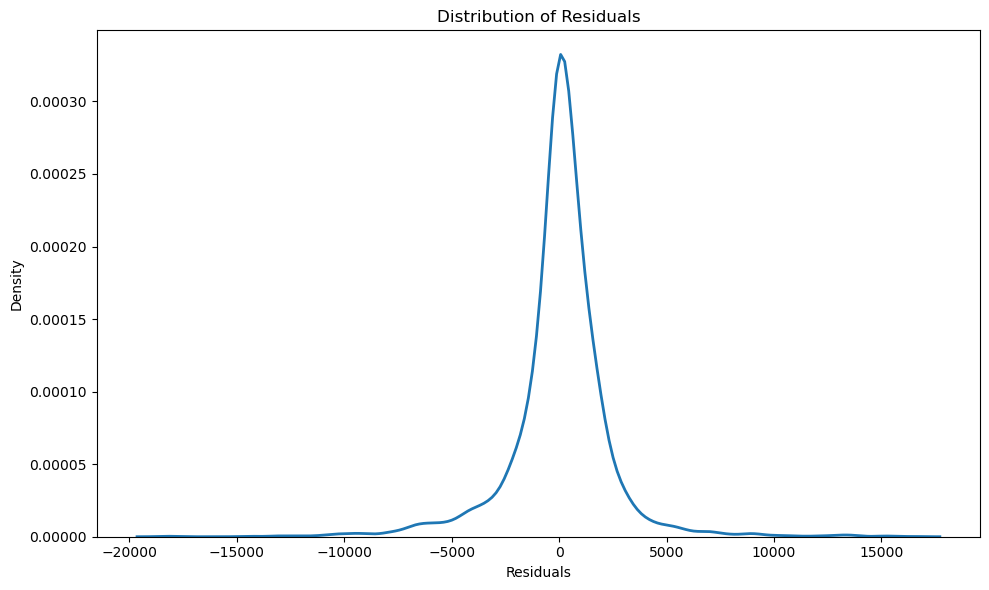

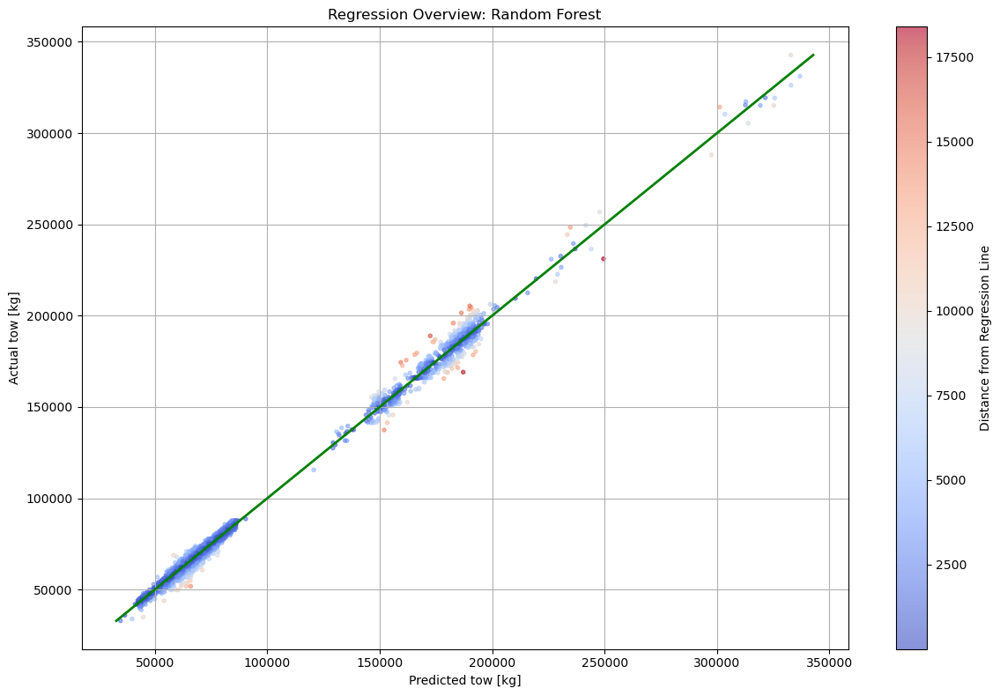

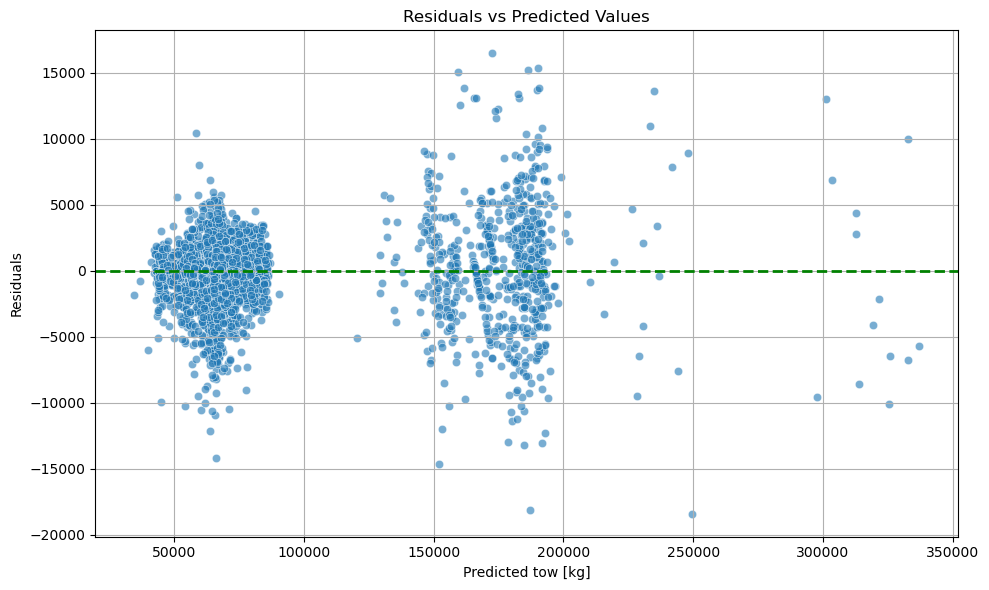

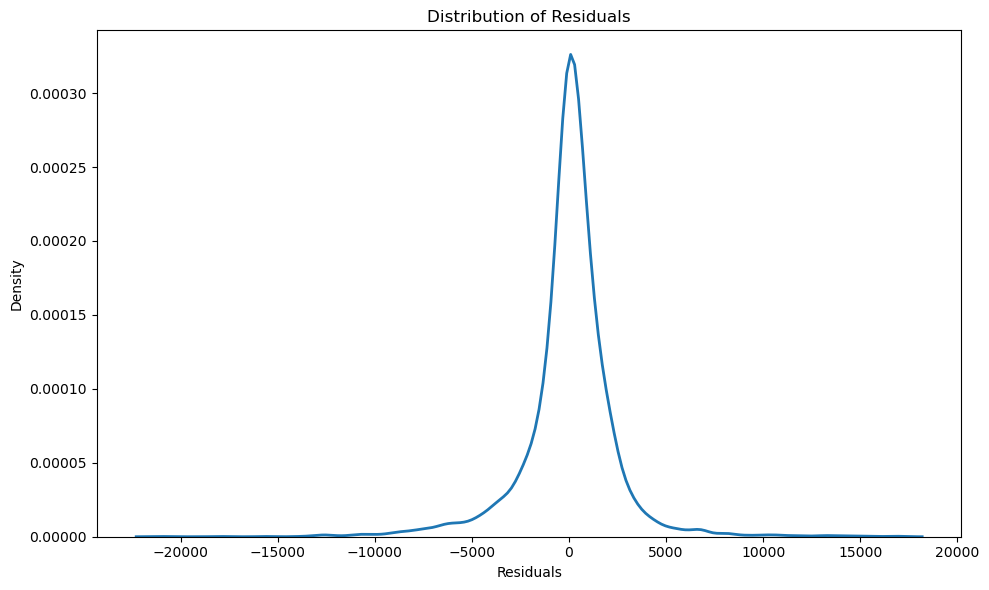

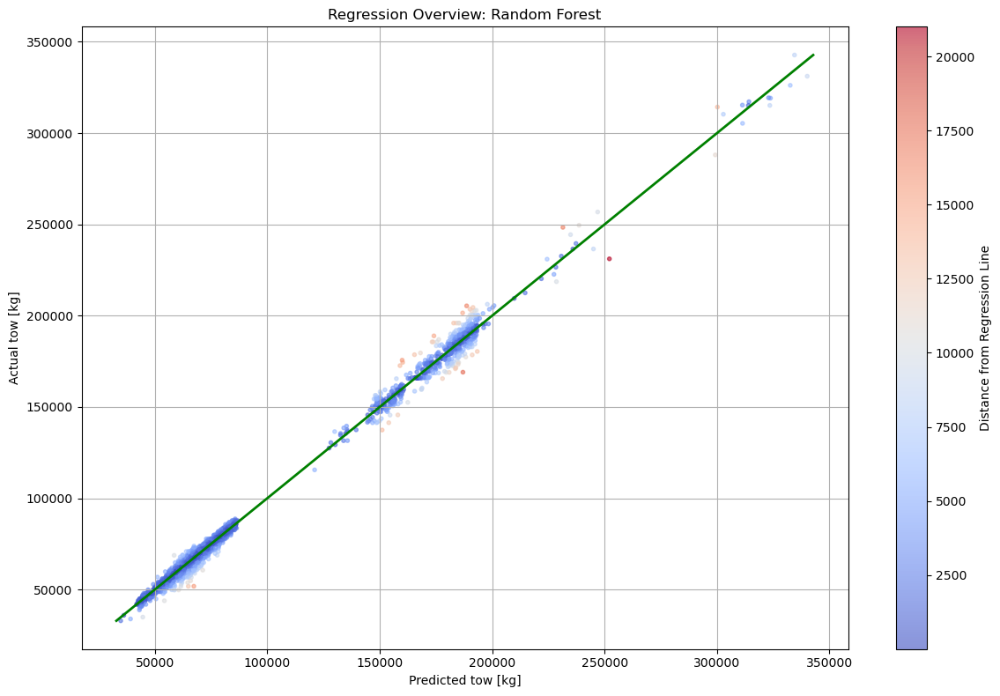

...

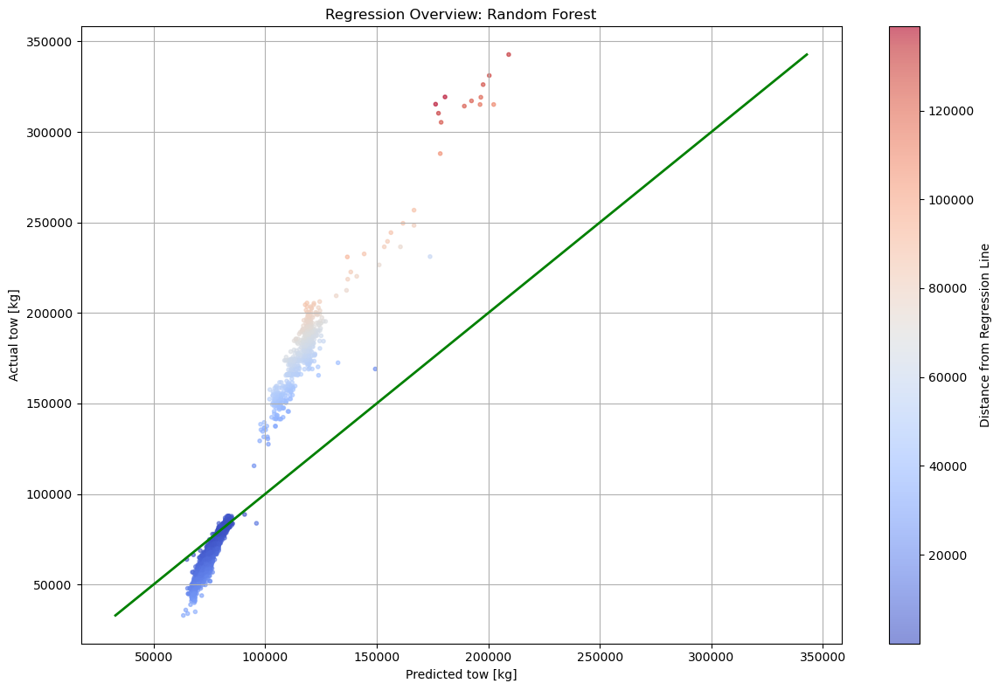

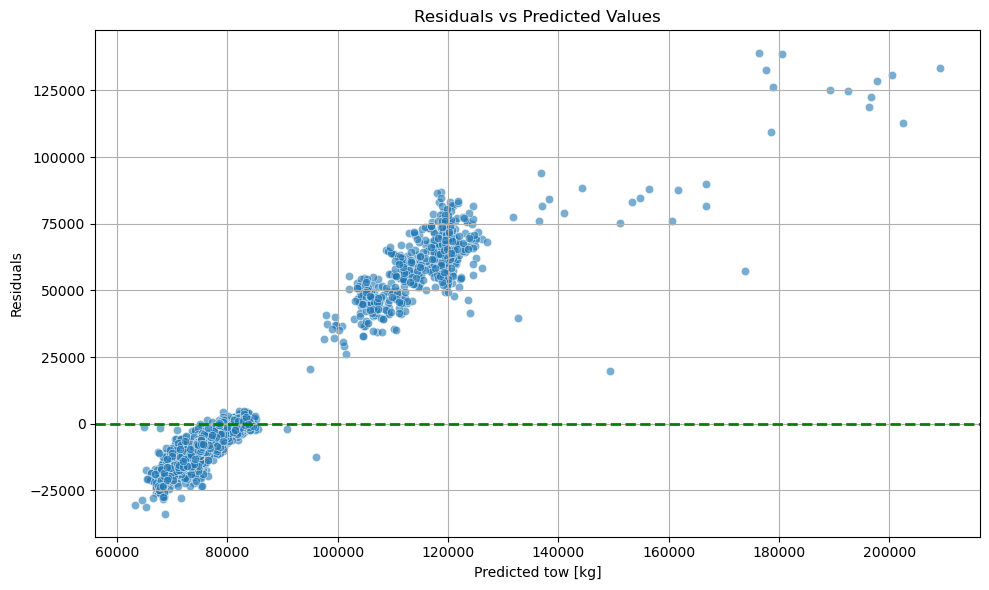

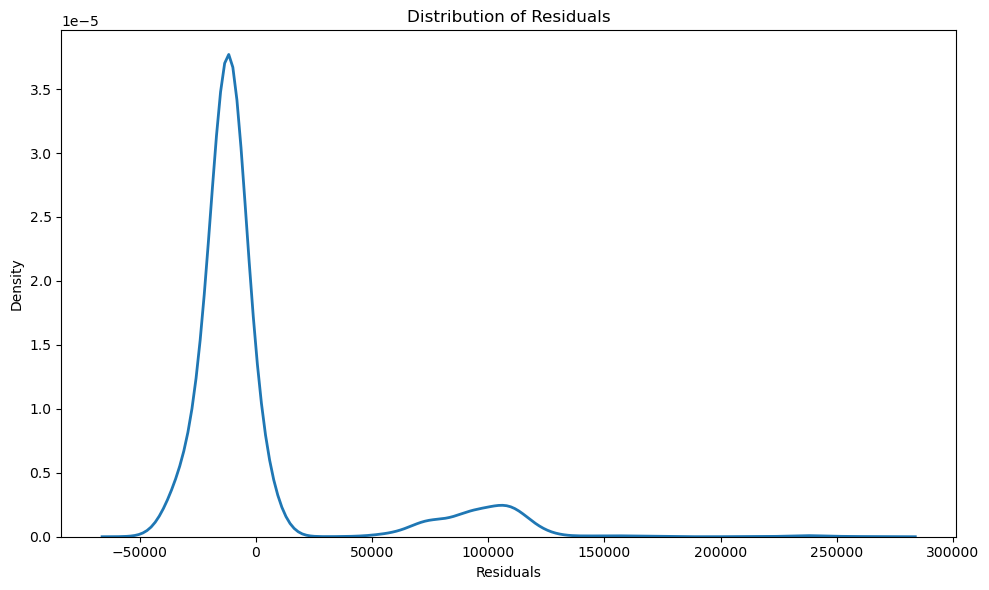

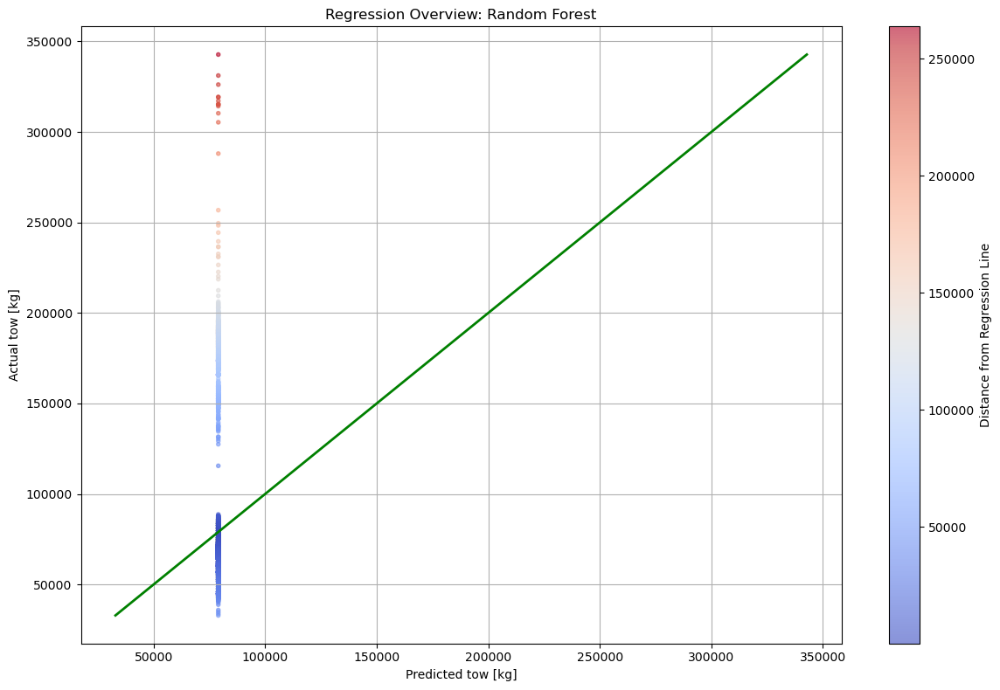

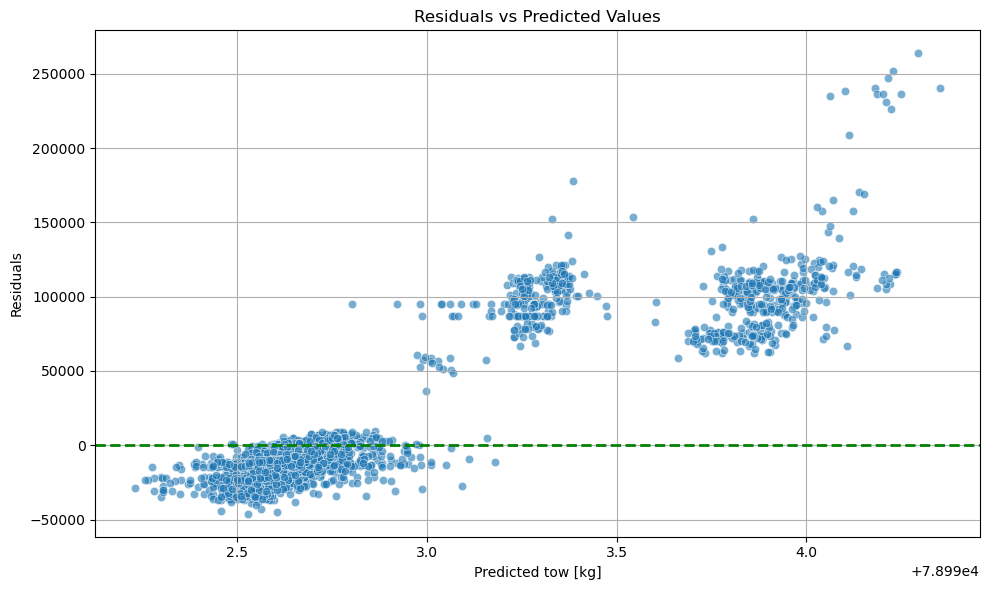

In [138]:
for name in aml.leaderboard.as_data_frame()['model_id']:
    model_name = name
    with mlflow.start_run():
        mlflow.log_input(dataset_2, context="training")
        mlflow.log_artifact('dataset_2/train_sample_CatBoost.csv', "dataset")
        mlflow.log_artifact('dataset_2/test_sample_CatBoost.csv', "dataset")
        signature = mlflow.models.infer_signature(X_test, y_test)
        model = h2o.get_model(model_name)
        mlflow.sklearn.log_model(model, model_name + '_dataset_2', registered_model_name=model_name + '_dataset_2', signature=signature)
        mlflow.set_tag("mlflow.runName", model_name + '_dataset_2')
        
        mlflow.log_param("ML_Algorithm", model_name)
        mlflow.log_param("Train_test_split", test_size)
        
        # try:
        #     for param, value in model.params.items():
        #         mlflow.log_param(param, value)  
        # except:
        #     mlflow.log_params(model.params)
        
        mlflow.log_params(model.params)
                                  
        y_pred = model.predict(test_sample)
        y_pred = y_pred.as_data_frame()['predict'].values
        cv_perf = model.model_performance(xval=True)
        mlflow.log_metric("MAE", cv_perf.mae())
        mlflow.log_metric("RMSE", cv_perf.rmse())
        mlflow.log_metric("R2", cv_perf.r2())
        
        residuals = y_test - y_pred
        plt.figure(figsize=(10, 6))
        sns.kdeplot(residuals, linewidth=2)
        plt.title('Distribution of Residuals')
        plt.xlabel('Residuals')
        plt.ylabel('Density')
        plt.tight_layout()
        plt.savefig('dataset_2/' + "residuals_distribution_" + model_name + ".png")
        
        distances = np.abs(y_pred - y_test)
        norm = Normalize(vmin=0, vmax=np.max(distances))
        colors = plt.cm.coolwarm(norm(distances))  # colormap
        plt.figure(figsize=(12, 8))
        scatter = plt.scatter(x=y_pred, y=y_test, c=distances, cmap='coolwarm', marker='.', alpha=0.6)
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'g-', lw=2, label='Ideal')
        plt.xlabel('Predicted tow [kg]')
        plt.ylabel('Actual tow [kg]')
        plt.title('Regression Overview: Random Forest')
        plt.grid(True)
        cbar = plt.colorbar(scatter)
        cbar.set_label('Distance from Regression Line')
        plt.tight_layout()
        plt.savefig('dataset_2/' + "regression_scatterplot_" + model_name + ".png")
        
        residuals = y_test - y_pred
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=y_pred, y=residuals, alpha=0.6)
        plt.axhline(0, color='green', linestyle='--', linewidth=2)
        plt.xlabel('Predicted tow [kg]')
        plt.ylabel('Residuals')
        plt.title('Residuals vs Predicted Values')
        plt.grid(True)
        plt.tight_layout()
        plt.savefig('dataset_2/' + "residuals_scatterplot_" + model_name + ".png")

        mlflow.log_artifact('dataset_2/' + "residuals_distribution_" + model_name + ".png",'Figures')
        mlflow.log_artifact('dataset_2/' + "regression_scatterplot_" + model_name + ".png",'Figures')
        mlflow.log_artifact('dataset_2/' + "residuals_scatterplot_" + model_name + ".png",'Figures')        
                